In [ ]:
import time
import json

from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.chrome.service import Service
from selenium.common.exceptions import InvalidSessionIdException, NoSuchElementException
from webdriver_manager.chrome import ChromeDriverManager
from pymongo import MongoClient

# ---------- MongoDB Setup ----------
mongo_client = MongoClient("mongodb://localhost:27017")
mongo_db = mongo_client["InteriorDesign"]
mongo_collection = mongo_db["ResidentialInteriors"]
# Create an index on "source" to avoid duplicates
mongo_collection.create_index("source", unique=True)

# ---------- Function to initialize the Selenium driver ----------
def init_driver():
    chrome_options = Options()
    chrome_options.add_argument("--headless")
    chrome_options.add_argument("--disable-gpu")
    chrome_options.add_argument("--window-size=1920,1080")
    service = Service(ChromeDriverManager().install())
    return webdriver.Chrome(service=service, options=chrome_options)

# Initialize driver
driver = init_driver()

# ---------- Function to scroll until desired number of project links are loaded ----------
def load_all_projects(max_scrolls=100, desired_count=1000):
    collected_links = set()
    old_count = 0

    for scroll_round in range(1, max_scrolls + 1):
        driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")
        time.sleep(4)  # Adjust the sleep time if needed

        anchors = driver.find_elements(By.CSS_SELECTOR, "a.gridview__content")
        for a in anchors:
            href = a.get_attribute("href")
            if href:
                collected_links.add(href)

        new_count = len(collected_links)
        print(f"Scroll #{scroll_round}: found {new_count} unique links.")
        if new_count == old_count:
            print("No new links found on this scroll. Stopping.")
            break
        if new_count >= desired_count:
            print(f"Reached {desired_count} links. Stopping.")
            break

        old_count = new_count

    return list(collected_links)

# ---------- Function to scrape project details from a project page ----------
def scrape_project_details(link):
    driver.get(link)
    time.sleep(5)  # Wait for the project page to load

    # Extract title
    try:
        title_el = driver.find_element(By.CSS_SELECTOR, "h1.afd-title-big")
        title = title_el.text.strip()
    except Exception:
        title = "Title not found"

    # Extract description by joining long paragraphs
    paragraphs = driver.find_elements(By.CSS_SELECTOR, "article p")
    description_paragraphs = []
    for p in paragraphs:
        text = p.text.strip()
        if len(text) < 50:
            continue
        # Skip paragraphs with unwanted keywords if needed
        if "by the architects" in text.lower():
            continue
        description_paragraphs.append(text)
    description = "\n\n".join(description_paragraphs)

    # Extract images, skipping logos and loader images
    image_elements = driver.find_elements(By.CSS_SELECTOR, "img[src*='adsttc.com']")
    images = []
    for img in image_elements:
        src = img.get_attribute("src")
        if not src:
            continue
        if "doodles/flat/logo" in src.lower():
            continue
        if "loader-blue.gif" in src.lower():
            continue
        images.append(src)

    return {
        "title": title,
        "description": description,
        "images": images,
        "source": link
    }

# ---------- Main Script ----------
if __name__ == "__main__":
    # Navigate to the ArchDaily Residential Interiors page
    url = "https://www.archdaily.com/search/projects/categories/residential-interiors?ad_medium=filters"
    driver.get(url)
    time.sleep(5)

    # Scroll to load project links (up to 1000 or until no new links)
    all_links = load_all_projects(max_scrolls=100, desired_count=1000)
    print(f"\nTotal unique project links collected: {len(all_links)}\n")

    projects_data = []
    project_counter = 0

    for idx, link in enumerate(all_links, start=1):
        print(f"Scraping project {idx}/{len(all_links)}: {link}")
        try:
            project_doc = scrape_project_details(link)
        except InvalidSessionIdException:
            print("Invalid session encountered. Reinitializing driver.")
            try:
                driver.quit()
            except Exception:
                pass
            driver = init_driver()
            # Retry once after reinitialization
            project_doc = scrape_project_details(link)
        except Exception as e:
            print(f"Error scraping project {link}: {e}")
            continue

        # Upsert project into MongoDB
        try:
            mongo_collection.update_one(
                {"source": project_doc["source"]},
                {"$set": project_doc},
                upsert=True
            )
            print(f"Inserted/Updated project in MongoDB: {project_doc['title']}")
        except Exception as e:
            print(f"Error inserting project {project_doc['title']} into MongoDB: {e}")

        projects_data.append(project_doc)
        project_counter += 1

        # Optionally reinitialize the driver every 50 projects to prevent session issues
        if project_counter % 50 == 0:
            print("Reinitializing driver after 50 projects.")
            try:
                driver.quit()
            except Exception:
                pass
            driver = init_driver()

    # Save the scraped data to a JSON file
    with open("residential_interiors.json", "w", encoding="utf-8") as f:
        json.dump(projects_data, f, ensure_ascii=False, indent=4)

    driver.quit()
    print("\nScraping completed! Data saved to 'residential_interiors.json' and inserted/updated in MongoDB.")



Process Mongo DB data and store in Postgresql in structured format.

In [ ]:
import re
from urllib.parse import urlsplit
from pymongo import MongoClient
import psycopg2

# ---------- Utility Functions ----------

def clean_description(desc):
    """Normalize the description text by replacing multiple newlines with one
    and stripping leading/trailing spaces."""
    if not desc:
        return ""
    desc = re.sub(r"\n+", "\n", desc)
    return desc.strip()

def filter_duplicate_images(images):
    """Given a list of image URLs, return only one URL per unique image
    (based on base path, ignoring query parameters)."""
    unique_images = {}
    for url in images:
        try:
            parsed = urlsplit(url)
            # scheme://netloc/path
            base_url = f"{parsed.scheme}://{parsed.netloc}{parsed.path}"
            # Only keep the first one encountered
            if base_url not in unique_images:
                unique_images[base_url] = url
        except Exception as e:
            print(f"Skipping malformed URL: {url} -> {e}")
    return list(unique_images.values())

# ---------- Main Script ----------

def main():
    
    # 1) Connect to the default DB (usually "postgres") to create the new DB
    
    print("Connecting to the default 'postgres' database as superuser to create new DB...")
    admin_conn = psycopg2.connect(
        dbname="postgres",   # Connect to the default DB
        user="postgres",     # Adjust if your user is different
        password="1234",     # Adjust to your actual password
        host="localhost",
        port="5432"
    )
    admin_conn.autocommit = True  # We need autocommit to create databases
    admin_cursor = admin_conn.cursor()

    new_db_name = "InteriorDesigningDB"  # <--- Name your new DB here

    # Try creating the new database
    print(f"Attempting to create database '{new_db_name}'...")
    try:
        admin_cursor.execute(f'CREATE DATABASE "{new_db_name}"')
        print(f"Database '{new_db_name}' created successfully.")
    except psycopg2.errors.DuplicateDatabase:
        print(f"Database '{new_db_name}' already exists. Skipping creation.")
    except Exception as e:
        print("Error creating database:", e)
        admin_cursor.close()
        admin_conn.close()
        return

    admin_cursor.close()
    admin_conn.close()

    
    # 2) Connect to the newly created database
    
    print(f"Connecting to database '{new_db_name}'...")
    conn = psycopg2.connect(
        dbname=new_db_name,
        user="postgres",     # same user as above or whichever has privileges
        password="1234",
        host="localhost",
        port="5432"
    )
    cursor = conn.cursor()

    
    
    #  Create tables (in public schema, or the custom one above)
    
    cursor.execute("""
    CREATE TABLE IF NOT EXISTS projects (
        id SERIAL PRIMARY KEY,
        source TEXT UNIQUE,
        title TEXT,
        description TEXT
    );
    """)
    cursor.execute("""
    CREATE TABLE IF NOT EXISTS project_images (
        id SERIAL PRIMARY KEY,
        project_id INT REFERENCES projects(id) ON DELETE CASCADE,
        image_url TEXT
    );
    """)
    conn.commit()

    
    # 5) Connect to MongoDB
    
    print("Connecting to MongoDB...")
    mongo_client = MongoClient("mongodb://localhost:27017")
    mongo_db = mongo_client["InteriorDesign"]         # e.g. "InteriorDesign"
    mongo_coll = mongo_db["ResidentialInteriors"]     # e.g. "ResidentialInteriors"

    
    # 6) Fetch docs from MongoDB
    
    all_docs = list(mongo_coll.find({}))
    print(f"Fetched {len(all_docs)} documents from 'ResidentialInteriors' in MongoDB.")

    
    # 7) Insert/Update each doc into the new Postgres DB
    
    for doc in all_docs:
        source = doc.get("source", "").strip()
        title = doc.get("title", "").strip()
        description = clean_description(doc.get("description", ""))
        images = doc.get("images", [])

        if not source or not title:
            # skip if critical fields are missing
            continue

        images_cleaned = filter_duplicate_images(images)

        # Upsert into 'projects' table
        insert_project_sql = """
            INSERT INTO projects (source, title, description)
            VALUES (%s, %s, %s)
            ON CONFLICT (source) DO UPDATE
                SET title = EXCLUDED.title,
                    description = EXCLUDED.description
            RETURNING id;
        """
        cursor.execute(insert_project_sql, (source, title, description))
        project_id = cursor.fetchone()[0]

        # Remove old images for this project, then insert the cleaned set
        cursor.execute("DELETE FROM project_images WHERE project_id = %s", (project_id,))
        for img_url in images_cleaned:
            cursor.execute("""
                INSERT INTO project_images (project_id, image_url)
                VALUES (%s, %s)
            """, (project_id, img_url))

    conn.commit()
    cursor.close()
    conn.close()
    print("All data successfully inserted/updated into PostgreSQL in the new database!")

if __name__ == "__main__":
    main()



Stored data was merged using Postgresql query tool in postgresql.
Running resolution check of images on postgresql collated table data

In [5]:
import requests
from requests.adapters import HTTPAdapter
from urllib3.util.retry import Retry
from PIL import Image
from io import BytesIO
import logging
import psycopg2
import concurrent.futures

# Configure logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Resolution thresholds
MIN_WIDTH = 512
MIN_HEIGHT = 512

def create_session():
    """
    Create a requests session with retry support and custom User-Agent.
    """
    session = requests.Session()
    retries = Retry(total=3, backoff_factor=1, status_forcelist=[429, 500, 502, 503, 504])
    adapter = HTTPAdapter(max_retries=retries)
    session.mount("http://", adapter)
    session.mount("https://", adapter)
    session.headers.update({
        "User-Agent": ("Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
                       "AppleWebKit/537.36 (KHTML, like Gecko) "
                       "Chrome/90.0.4430.85 Safari/537.36")
    })
    return session

# Create a global session
session = create_session()

def fetch_image_resolution_sync(url: str) -> str:
    """
    Synchronously fetch an image using requests and check its resolution.
    Returns the URL if it meets the resolution criteria, else returns None.
    """
    try:
        response = session.get(url, timeout=5)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content))
        width, height = img.size
        if width >= MIN_WIDTH and height >= MIN_HEIGHT:
            logging.info(f"Image {url} passes resolution check: {width}x{height}")
            return url
        else:
            logging.info(f"Image {url} fails resolution check: {width}x{height}")
            return None
    except Exception as e:
        logging.error(f"Error fetching or processing {url}: {e}")
        return None

def process_project(project_id: int, image_list: list) -> (int, list):
    """
    Process all image URLs for a project concurrently using ThreadPoolExecutor.
    Filters out images based on low-quality indicators and resolution.
    Returns (project_id, list of up to 5 qualifying image URLs).
    """
    # Filter out URLs that contain low-quality indicators
    urls_to_check = [
        url for url in image_list 
        if not any(kw in url.lower() for kw in ["thumb_jpg", "loader-blue.gif", "doodles/flat/logo"])
    ]
    logging.info(f"Project ID {project_id}: checking {len(urls_to_check)} images concurrently.")

    good_images = []
    # Use ThreadPoolExecutor to process URLs concurrently
    with concurrent.futures.ThreadPoolExecutor(max_workers=10) as executor:
        future_to_url = {executor.submit(fetch_image_resolution_sync, url): url for url in urls_to_check}
        for future in concurrent.futures.as_completed(future_to_url):
            result = future.result()
            if result is not None:
                good_images.append(result)
            if len(good_images) >= 5:
                break  # We only need the top 5 images

    return project_id, good_images[:5]

def update_project_in_db(conn, project_id: int, images_str: str):
    """
    Update the given project's images field in the database.
    """
    cursor = conn.cursor()
    cursor.execute("UPDATE projects_collated SET images = %s WHERE id = %s", (images_str, project_id))
    conn.commit()
    cursor.close()
    count = len(images_str.split(',')) if images_str else 0
    logging.info(f"Updated project ID {project_id} with {count} high quality images.")

def main():
    # Connect to your PostgreSQL database
    conn = psycopg2.connect(
        dbname="InteriorDesigningDB",
        user="postgres",
        password="1234",
        host="localhost",
        port="5432"
    )
    cursor = conn.cursor()
    cursor.execute("SELECT id, images FROM projects_collated")
    rows = cursor.fetchall()
    cursor.close()
    
    logging.info(f"Fetched {len(rows)} projects from the database.")
    
    # Process each project
    for row in rows:
        project_id = row[0]
        images_str = row[1]
        if not images_str:
            logging.info(f"Project ID {project_id} has no images, skipping.")
            continue
        image_list = [img.strip() for img in images_str.split(',') if img.strip()]
        logging.info(f"Processing project ID {project_id} with {len(image_list)} images.")
        proj_id, top_images = process_project(project_id, image_list)
        updated_images_str = ",".join(top_images)
        update_project_in_db(conn, proj_id, updated_images_str)
    
    conn.close()
    logging.info("All projects updated.")

if __name__ == "__main__":
    main()


2025-03-31 11:25:23,300 - INFO - Fetched 1008 projects from the database.
2025-03-31 11:25:23,300 - INFO - Processing project ID 3 with 35 images.
2025-03-31 11:25:23,301 - INFO - Project ID 3: checking 35 images concurrently.
2025-03-31 11:25:23,424 - INFO - Image https://images.adsttc.com/media/images/67a6/3f83/e862/3700/01c0/7f52/medium_jpg/Am_Tacheles_2_3000px.jpg?1738948513 passes resolution check: 528x704
2025-03-31 11:25:23,428 - INFO - Image https://images.adsttc.com/media/images/67a6/43c8/088f/c406/8247/fb03/newsletter/takk-ullenboom-tacheles-grundriss-22.jpg?1738949653 passes resolution check: 750x530
2025-03-31 11:25:23,432 - INFO - Image https://images.adsttc.com/media/images/67a6/3f89/e862/3700/01c0/7f62/medium_jpg/Am_Tacheles_20_3000px.jpg?1738948637 passes resolution check: 528x792
2025-03-31 11:25:23,444 - INFO - Image https://images.adsttc.com/media/images/67a6/3f89/e862/3700/01c0/7f61/newsletter/Am_Tacheles_19_4000px.jpg?1738948605 fails resolution check: 750x500
2025

TEXT PROCESSING:

Since every project had multiple images with a mean of around 20 images the description of every project was duplicated for all the images in the same project.

In [ ]:
import pandas as pd

# Connect to PostgreSQL
conn = psycopg2.connect(
    dbname="InteriorDesigningDB",
    user="postgres",
    password="1234",
    host="localhost",
    port="5432"
)
cursor = conn.cursor()

# Fetch data
cursor.execute("""
    SELECT id, description, images
    FROM projects_collated
    WHERE description IS NOT NULL AND images IS NOT NULL
""")
rows = cursor.fetchall()
cursor.close()
conn.close()

# Create DataFrame
df = pd.DataFrame(rows, columns=["id", "description", "images"])

# Expand to one row per image
expanded_data = []
for _, row in df.iterrows():
    image_urls = [url.strip() for url in row["images"].split(",") if url.strip()]
    for image_url in image_urls:
        expanded_data.append({
            "project_id": row["id"],
            "description": row["description"],
            "image_url": image_url
        })

expanded_df = pd.DataFrame(expanded_data)

# Save to CSV (optional)
expanded_df.to_csv("project_image_pairs.csv", index=False)

print("Expanded dataset created with", len(expanded_df), "rows.")


Expanded dataset created with 34671 rows.


In [61]:

# Load the CSV file into a DataFrame
df = pd.read_csv("project_image_pairs.csv")

# Display the first few rows of the DataFrame
print("First 5 rows of the dataset:")
print(df.head())

# Display the shape of the DataFrame (number of rows and columns)
print("\nDataFrame shape (rows, columns):", df.shape)

# Print detailed information about DataFrame columns, data types, and non-null counts
print("\nDataFrame info:")
print(df.info())

# Show summary statistics for any numerical columns (if applicable)
print("\nSummary statistics:")
print(df.describe())

# Check for null values in each column
print("\nCount of null values in each column:")
print(df.isnull().sum())


First 5 rows of the dataset:
   project_id                                        description  \
0         717  The purpose of the apartment was to accommodat...   
1         717  The purpose of the apartment was to accommodat...   
2         717  The purpose of the apartment was to accommodat...   
3         717  The purpose of the apartment was to accommodat...   
4         717  The purpose of the apartment was to accommodat...   

                                           image_url  
0  https://images.adsttc.com/media/images/65f4/6e...  
1  https://images.adsttc.com/media/images/65f4/6d...  
2  https://images.adsttc.com/media/images/65f4/6d...  
3  https://images.adsttc.com/media/images/65f4/6d...  
4  https://images.adsttc.com/media/images/65f4/6e...  

DataFrame shape (rows, columns): (34671, 3)

DataFrame info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34671 entries, 0 to 34670
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       ---

Download images to decrease processing time, and then reduce resolution for the images for faster processing

In [69]:
import os
import pandas as pd
import requests
from PIL import Image
from io import BytesIO

# Base directory relative to your notebook's location
base_dir = './project_images'

# Create the base directory if it doesn't exist
if not os.path.exists(base_dir):
    os.makedirs(base_dir)

# DataFrame to store the project_id and associated description
reference_df = pd.DataFrame(columns=['project_id', 'description', 'image_directory'])

def download_image(url, file_path):
    """ Download an image from a URL, convert to RGB if necessary, and save it to a file. """
    try:
        response = requests.get(url, timeout=10)  # timeout in seconds
        if response.status_code == 200:
            image = Image.open(BytesIO(response.content))
            if image.mode != 'RGB':
                image = image.convert('RGB')  # Convert the image to RGB mode if it's not
            image.save(file_path)
            return True
    except requests.RequestException as e:
        print(f"Failed to download {url}. Reason: {str(e)}")
        return False
    except OSError as e:
        print(f"Error saving image {file_path}. Reason: {str(e)}")
        return False

for project_id, group in df.groupby('project_id'):
    # Directory for each project
    project_dir = os.path.join(base_dir, str(project_id))
    if not os.path.exists(project_dir):
        os.makedirs(project_dir)
    
    description = group['description'].iloc[0]  # Assuming all descriptions per project_id are the same

    for index, row in group.iterrows():
        file_path = os.path.join(project_dir, f"image_{index}.jpg")
        if not os.path.isfile(file_path):  # Avoid re-downloading
            if download_image(row['image_url'], file_path):
                # Successfully downloaded, record in DataFrame
                new_row = pd.DataFrame({
                    'project_id': [project_id],
                    'description': [description],
                    'image_directory': [project_dir]
                })
                reference_df = pd.concat([reference_df, new_row], ignore_index=True)

# Save the reference DataFrame to a CSV file
reference_df.to_csv(os.path.join(base_dir, 'description_reference.csv'), index=False)


Failed to download https://images.adsttc.com/media/images/66df/53f1/7509/0c76/3350/3b86/medium_jpg/vyshyto-house-makhno-studio_5.jpg?1725912065. Reason: HTTPSConnectionPool(host='images.adsttc.com', port=443): Max retries exceeded with url: /media/images/66df/53f1/7509/0c76/3350/3b86/medium_jpg/vyshyto-house-makhno-studio_5.jpg?1725912065 (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x3019b8910>: Failed to establish a new connection: [Errno 61] Connection refused'))
Failed to download https://images.adsttc.com/media/images/66df/5406/7509/0c76/3350/3b96/medium_jpg/vyshyto-house-makhno-studio_50.jpg?1725912097. Reason: HTTPSConnectionPool(host='images.adsttc.com', port=443): Max retries exceeded with url: /media/images/66df/5406/7509/0c76/3350/3b96/medium_jpg/vyshyto-house-makhno-studio_50.jpg?1725912097 (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x3019b8cd0>: Failed to establish a new connection: [Errno 61] Connection ref

Downloaded images downsized and stored

In [2]:
import os
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input

# Base directory where images are stored
base_dir = './project_images'

def load_and_preprocess_image(img_path):
    """ Load and preprocess an image from a given file path. """
    img = image.load_img(img_path, target_size=(224, 224))  # Resize image
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)  # Preprocess based on the model being used
    return img_array

# Walk through the project directories and process each image
for project_id in os.listdir(base_dir):
    project_dir = os.path.join(base_dir, project_id)
    if os.path.isdir(project_dir):  # Ensure it's a directory
        for img_file in os.listdir(project_dir):
            img_path = os.path.join(project_dir, img_file)
            img_array = load_and_preprocess_image(img_path)
            # Now img_array is ready to be used with a model

            print(f"Processed image: {img_path} Shape: {img_array.shape}")

# Include any other steps you need such as loading labels or descriptions


Processed image: ./project_images/797/image_30340.jpg Shape: (1, 224, 224, 3)
Processed image: ./project_images/797/image_30354.jpg Shape: (1, 224, 224, 3)
Processed image: ./project_images/797/image_30368.jpg Shape: (1, 224, 224, 3)
Processed image: ./project_images/797/image_30383.jpg Shape: (1, 224, 224, 3)
Processed image: ./project_images/797/image_30382.jpg Shape: (1, 224, 224, 3)
Processed image: ./project_images/797/image_30369.jpg Shape: (1, 224, 224, 3)
Processed image: ./project_images/797/image_30355.jpg Shape: (1, 224, 224, 3)
Processed image: ./project_images/797/image_30341.jpg Shape: (1, 224, 224, 3)
Processed image: ./project_images/797/image_30357.jpg Shape: (1, 224, 224, 3)
Processed image: ./project_images/797/image_30343.jpg Shape: (1, 224, 224, 3)
Processed image: ./project_images/797/image_30380.jpg Shape: (1, 224, 224, 3)
Processed image: ./project_images/797/image_30381.jpg Shape: (1, 224, 224, 3)
Processed image: ./project_images/797/image_30342.jpg Shape: (1,

The programmer wanted to work closely with real architects, hence there written description were scrapped which showcases some challanges with BERT and other models. A well curated prompt works well but texts by non coders exposes opportunities in this domain

Description Length Statistics:
count    34162.000000
mean       328.943329
std        183.046684
min         29.000000
25%        197.000000
50%        302.000000
75%        416.000000
max       1264.000000
Name: description_length, dtype: float64


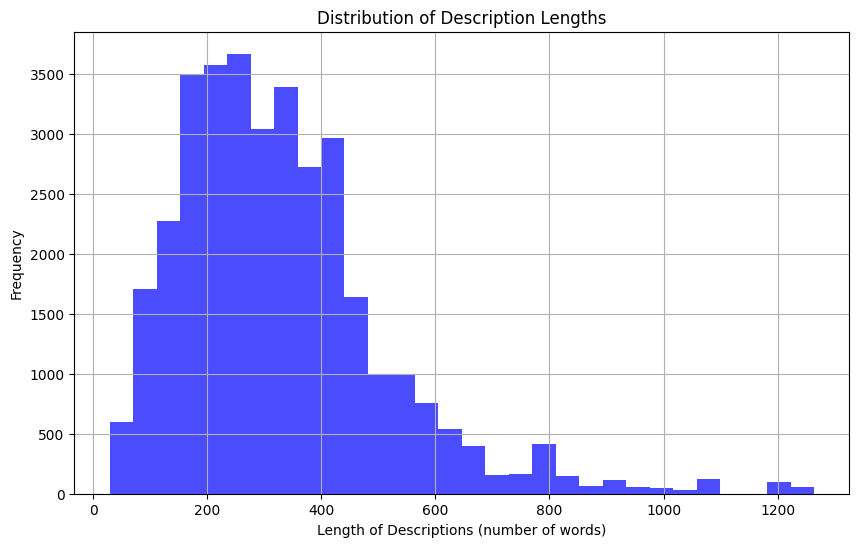

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming reference_df is already loaded with your descriptions
# If not, load it from the CSV where you've stored your project info
reference_df = pd.read_csv('./project_images/description_reference.csv')

# Calculate the length of each description
reference_df['description_length'] = reference_df['description'].apply(lambda x: len(x.split()))

# Print basic statistics
print("Description Length Statistics:")
print(reference_df['description_length'].describe())

# Plotting the distribution of description lengths
plt.figure(figsize=(10, 6))
plt.hist(reference_df['description_length'], bins=30, color='blue', alpha=0.7)
plt.title('Distribution of Description Lengths')
plt.xlabel('Length of Descriptions (number of words)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


BERT model were used to process long human written texts.

In [1]:
import pandas as pd
import tensorflow as tf
from transformers import BertTokenizer, TFBertModel
from tqdm import tqdm

# Load descriptions from the previously used CSV file
df = pd.read_csv('./project_images/description_reference.csv')

# Initialize the BERT tokenizer and model from the pre-trained 'bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = TFBertModel.from_pretrained('bert-base-uncased')

def bert_encode(descriptions, tokenizer, max_length=512):
    input_ids = []
    attention_masks = []

    for desc in descriptions:
        encoded = tokenizer.encode_plus(
            desc,
            add_special_tokens=True,  # Add '[CLS]' and '[SEP]'
            max_length=max_length,  # Maximum length for BERT input
            pad_to_max_length=True,  # Pad to max_length if not enough tokens
            return_attention_mask=True,  # Include attention masks to focus BERT on non-padded elements
            return_tensors='tf'  # Return TensorFlow tensors
        )
        input_ids.append(encoded['input_ids'])
        attention_masks.append(encoded['attention_mask'])

    input_ids = tf.concat(input_ids, axis=0)
    attention_masks = tf.concat(attention_masks, axis=0)

    return input_ids, attention_masks

# Batch process descriptions to avoid memory overflow
batch_size = 10  # Modify based on your machine's capability
embeddings = []

for i in tqdm(range(0, len(df), batch_size)):
    batch = df['description'][i:i + batch_size]
    input_ids, attention_masks = bert_encode(batch, tokenizer)
    outputs = model(input_ids, attention_mask=attention_masks)
    embeddings.extend(outputs.pooler_output.numpy())

# Convert the embeddings to a DataFrame and save for future use
embeddings_df = pd.DataFrame(embeddings)
embeddings_df.to_csv('./project_images/bert_embeddings.csv', index=False)

print("Embeddings have been saved to './project_images/bert_embeddings.csv'.")


/Users/narendrachilwal/.pyenv/versions/3.10.7/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. 

Embeddings have been saved to './project_images/bert_embeddings.csv'.


Images preprocessed using VGG16. 

In [3]:
import os
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input

# Define the base directories
original_images_dir = './project_images'  # Where the original images are stored
processed_images_dir = './processed_images'  # Where processed images will be saved

# Create the processed images directory if it doesn't exist
if not os.path.exists(processed_images_dir):
    os.makedirs(processed_images_dir)

def load_and_preprocess_image(img_path):
    """Load and preprocess an image from a given file path."""
    img = image.load_img(img_path, target_size=(224, 224))  # Resize to 224x224 pixels
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)  # Apply VGG16 preprocessing
    return img_array

# Iterate over each project folder in the original images directory
for project_id in os.listdir(original_images_dir):
    project_path = os.path.join(original_images_dir, project_id)
    if os.path.isdir(project_path):
        # Create a corresponding folder in the processed images directory
        processed_project_dir = os.path.join(processed_images_dir, project_id)
        if not os.path.exists(processed_project_dir):
            os.makedirs(processed_project_dir)
        
        # Process each image in the project folder
        for img_file in os.listdir(project_path):
            img_path = os.path.join(project_path, img_file)
            try:
                img_array = load_and_preprocess_image(img_path)
                # Save the processed image array as a .npy file
                processed_img_filename = os.path.splitext(img_file)[0] + '_processed.npy'
                processed_img_path = os.path.join(processed_project_dir, processed_img_filename)
                np.save(processed_img_path, img_array)
                print(f"Saved processed image: {processed_img_path}")
            except Exception as e:
                print(f"Error processing {img_path}: {str(e)}")


Saved processed image: ./processed_images/797/image_30340_processed.npy
Saved processed image: ./processed_images/797/image_30354_processed.npy
Saved processed image: ./processed_images/797/image_30368_processed.npy
Saved processed image: ./processed_images/797/image_30383_processed.npy
Saved processed image: ./processed_images/797/image_30382_processed.npy
Saved processed image: ./processed_images/797/image_30369_processed.npy
Saved processed image: ./processed_images/797/image_30355_processed.npy
Saved processed image: ./processed_images/797/image_30341_processed.npy
Saved processed image: ./processed_images/797/image_30357_processed.npy
Saved processed image: ./processed_images/797/image_30343_processed.npy
Saved processed image: ./processed_images/797/image_30380_processed.npy
Saved processed image: ./processed_images/797/image_30381_processed.npy
Saved processed image: ./processed_images/797/image_30342_processed.npy
Saved processed image: ./processed_images/797/image_30356_proces

DATASET SPLITTING FOR TEST AND TRAIN

In [8]:
from sklearn.model_selection import train_test_split
import pandas as pd

# Load the reference CSV (which contains one row per image with project_id, description, etc.)
df_full = pd.read_csv('./project_images/description_reference.csv')

# Get the unique project IDs (this ensures we split on a per-project basis)
unique_projects = df_full['project_id'].unique()

# Split the unique project IDs into training and testing groups (70% train, 30% test)
train_projects, test_projects = train_test_split(unique_projects, test_size=0.30, random_state=42)

# Filter the full DataFrame to create separate training and testing sets based on project_id
train_df = df_full[df_full['project_id'].isin(train_projects)]
test_df = df_full[df_full['project_id'].isin(test_projects)]

# Print the shapes to verify the split
print("Training set shape:", train_df.shape)
print("Testing set shape:", test_df.shape)


Training set shape: (24258, 3)
Testing set shape: (9904, 3)


In [11]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf

# ----- Step 1: Ensure your train_df has the processed image paths -----
# (Run this once if not already done.)
def assign_processed_image_paths(df, processed_images_dir='./processed_images'):
    processed_paths = {}  # mapping from row index (in df) to the full path

    # Group rows by project_id.
    for project_id, group in df.groupby('project_id'):
        folder_path = os.path.join(processed_images_dir, str(project_id))
        if not os.path.exists(folder_path):
            print(f"Warning: Processed folder for project {project_id} not found.")
            continue
        # List processed image files in that folder, sorted alphabetically.
        files = sorted([f for f in os.listdir(folder_path) if f.endswith('.npy')])
        group_indices = group.index.tolist()
        if len(files) != len(group_indices):
            print(f"Warning: For project {project_id}, number of processed images ({len(files)}) does not match number of rows ({len(group_indices)}).")
        for i, idx in enumerate(group_indices):
            if i < len(files):
                processed_paths[idx] = os.path.join(folder_path, files[i])
            else:
                processed_paths[idx] = None
    df = df.copy()
    df['processed_image_path'] = df.index.map(lambda i: processed_paths.get(i, None))
    return df

# (Assuming you already have train_df from your split code)
train_df = assign_processed_image_paths(train_df, processed_images_dir='./processed_images')

# ----- Step 2: Load the Full BERT Embeddings -----
# Load the full BERT embeddings array (from your earlier saved CSV)
embeddings_full = pd.read_csv('./project_images/bert_embeddings.csv').values
# Note: We assume that the order of embeddings corresponds to the original full dataset,
# so we use the original row index (stored in train_df.index) to fetch the correct embedding.

# ----- Step 3: Define the Data Loader Generator -----
def load_sample(row, embeddings_array):
    # Use the processed_image_path instead of 'image_url'
    img_path = row['processed_image_path']
    if img_path is None or not os.path.exists(img_path):
        print(f"Error: Processed image not found for row index {row.name}")
        img_array = np.zeros((1, 224, 224, 3), dtype=np.float32)
    else:
        img_array = np.load(img_path)
    
    # Retrieve the corresponding BERT embedding using the original row index.
    # (train_df.index matches the original row indices of the full dataset.)
    orig_idx = int(row['index'])
    embedding = embeddings_full[orig_idx]
    return img_array, embedding

def data_generator(df, embeddings_array):
    for i, row in df.iterrows():
        yield load_sample(row, embeddings_array)

# ----- Step 4: Build the TensorFlow Dataset -----
# Determine the embedding dimension from embeddings_full.
embedding_dim = embeddings_full.shape[1]

# Define the output signature for tf.data.Dataset.
# Processed image shape: (1, 224, 224, 3); embedding: vector of length embedding_dim.
output_signature = (
    tf.TensorSpec(shape=(1, 224, 224, 3), dtype=tf.float32),
    tf.TensorSpec(shape=(embedding_dim,), dtype=tf.float32)
)

# Create the dataset from the generator.
train_dataset = tf.data.Dataset.from_generator(
    lambda: data_generator(train_df, embeddings_full),
    output_signature=output_signature
)

# Batch and prefetch for efficient training.
train_dataset = train_dataset.batch(32).prefetch(tf.data.AUTOTUNE)

# ----- Step 5: Verify the Data Loader Output -----
for batch_images, batch_embeddings in train_dataset.take(1):
    print("Batch images shape:", batch_images.shape)      # Expected: (batch_size, 1, 224, 224, 3)
    print("Batch embeddings shape:", batch_embeddings.shape)  # Expected: (batch_size, embedding_dim)


Batch images shape: (32, 1, 224, 224, 3)
Batch embeddings shape: (32, 768)


In [16]:
import os
import numpy as np
import pandas as pd
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model

# Define directories
processed_images_dir = './processed_images'
reference_csv_path = './project_images/description_reference.csv'
output_features_csv = './project_images/extracted_image_features.csv'

# Load your reference DataFrame that includes project_id and description
df_ref = pd.read_csv(reference_csv_path)

# Assign processed image paths to each row based on your project folder structure
def assign_processed_image_paths(df, processed_images_dir):
    processed_paths = {}
    # Group by project_id
    for project_id, group in df.groupby('project_id'):
        folder_path = os.path.join(processed_images_dir, str(project_id))
        if not os.path.exists(folder_path):
            print(f"Warning: Processed folder for project {project_id} not found.")
            continue
        # List processed image files (assumed to end with '.npy'), sorted alphabetically
        files = sorted([f for f in os.listdir(folder_path) if f.endswith('.npy')])
        group_indices = group.index.tolist()
        for i, idx in enumerate(group_indices):
            if i < len(files):
                processed_paths[idx] = os.path.join(folder_path, files[i])
            else:
                processed_paths[idx] = None
    df = df.copy()
    df['processed_image_path'] = df.index.map(lambda i: processed_paths.get(i, None))
    return df

# Update df_ref with the processed image paths
df_ref = assign_processed_image_paths(df_ref, processed_images_dir)

# Initialize VGG16 for feature extraction (using global average pooling)
feature_extractor = VGG16(weights='imagenet', include_top=False, pooling='avg')

# Loop through each row and extract image features
features_list = []
for idx, row in df_ref.iterrows():
    img_path = row['processed_image_path']
    if img_path is None or not os.path.exists(img_path):
        print(f"Skipping row {idx}: Processed image not found.")
        # Append a zero vector if image not found (using output shape of the feature extractor)
        features_list.append(np.zeros(feature_extractor.output_shape[1],))
    else:
        # Load the preprocessed image (expected shape: (1, 224, 224, 3))
        img_array = np.load(img_path)
        # Pass the image through the model to extract features
        features = feature_extractor.predict(img_array)
        features_list.append(features.flatten())

# Convert list to numpy array
image_features = np.array(features_list)

# Create column names for the features (e.g., feature_0, feature_1, ...)
feature_dim = image_features.shape[1]
feature_columns = [f'feature_{i}' for i in range(feature_dim)]

# Build a DataFrame for the features with additional info
features_df = pd.DataFrame(image_features, columns=feature_columns)
features_df['project_id'] = df_ref['project_id'].values
features_df['row_index'] = df_ref.index

# Save the extracted features to CSV
features_df.to_csv(output_features_csv, index=False)
print(f"Extracted image features saved to '{output_features_csv}'.")


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/ste

In [2]:
import os
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models


# Paths to your saved CSV files
reference_csv_path = './project_images/description_reference.csv'
bert_embeddings_csv = './project_images/bert_embeddings.csv'
extracted_features_csv = './project_images/extracted_image_features.csv'

# Load the reference DataFrame (to get project_id info)
ref_df = pd.read_csv(reference_csv_path)

# Load precomputed BERT embeddings (assumed to be in the same order as ref_df)
bert_embeddings = pd.read_csv(bert_embeddings_csv).values  # Shape: (N, text_embedding_dim)

# Load extracted image features (ensure same ordering as ref_df)
features_df = pd.read_csv(extracted_features_csv)
# Extract only the feature columns (assumes they are named as feature_0, feature_1, ...)
feature_columns = [col for col in features_df.columns if col.startswith('feature_')]
image_features = features_df[feature_columns].values  # Shape: (N, image_feature_dim)

# Split the data by unique project_id (to ensure no leakage)
unique_projects = ref_df['project_id'].unique()
train_projects, test_projects = train_test_split(unique_projects, test_size=0.30, random_state=42)

# Create boolean masks for training and testing based on project_id
train_mask = ref_df['project_id'].isin(train_projects)
test_mask = ref_df['project_id'].isin(test_projects)

# Split the BERT embeddings (inputs) and image features (targets)
X_train = bert_embeddings[train_mask.values]
Y_train = image_features[train_mask.values]
X_test = bert_embeddings[test_mask.values]
Y_test = image_features[test_mask.values]

print("Training set shape (inputs):", X_train.shape)
print("Training set shape (targets):", Y_train.shape)
print("Testing set shape (inputs):", X_test.shape)
print("Testing set shape (targets):", Y_test.shape)

# Determine input and output dimensions
text_embedding_dim = X_train.shape[1]  # e.g., 768 for BERT-base
image_feature_dim = Y_train.shape[1]

# Build a simple regression model mapping text embeddings to image features
model = models.Sequential([
    layers.Input(shape=(text_embedding_dim,)),
    layers.Dense(256, activation='relu'),
    layers.Dense(128, activation='relu'),
    layers.Dense(image_feature_dim)  # Linear output for regression
])

model.compile(optimizer='adam', loss='mean_squared_error')
model.summary()

# Train the model (adjust epochs and batch_size as needed)
history = model.fit(
    X_train, Y_train,
    validation_data=(X_test, Y_test),
    epochs=10,
    batch_size=32
)

# Evaluate the model on the test set (MSE)
test_loss = model.evaluate(X_test, Y_test, verbose=0)
print("Test Mean Squared Error (MSE):", test_loss)


Training set shape (inputs): (24258, 768)
Training set shape (targets): (24258, 512)
Testing set shape (inputs): (9904, 768)
Testing set shape (targets): (9904, 512)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 256)            │       196,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 512)            │        66,048 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 295,808 (1.13 MB)

 Trainable params: 295,808 (1.13 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 9.7151 - val_loss: 9.1644
Epoch 2/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 9.1638 - val_loss: 9.1155
Epoch 3/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 9.1343 - val_loss: 9.0845
Epoch 4/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 9.0994 - val_loss: 9.0998
Epoch 5/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 9.0316 - val_loss: 9.1044
Epoch 6/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 9.0851 - val_loss: 9.0690
Epoch 7/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 8.9622 - val_loss: 9.0588
Epoch 8/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 9.0007 - val_loss: 9.1038
Epoch 9/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 9.0267 - val_loss: 9.0524
Epoch 10/10
759/759 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 8.9756 - val_loss: 9.1136
Test Mean Squared Error (MSE): 9.113554000854492


STABLE DIFFUSION: 

In [ ]:
import torch
from diffusers import StableDiffusionPipeline
import os

# Check if MPS (Apple Silicon GPU) is available, otherwise use CPU
device = "mps" if torch.backends.mps.is_available() else "cpu"
print("Using device:", device)

# Load a pre-trained Stable Diffusion model
# You may choose a different model if needed.
model_id = "CompVis/stable-diffusion-v1-4"

# For Apple Silicon, load the model in half precision (fp16) for speed
pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    revision="fp16", 
    torch_dtype=torch.float16,
)
pipe = pipe.to(device)

# Example text prompt (you can loop through your text descriptions here)
prompt = "A futuristic cityscape with flying cars and neon lights."

# Generate an image from the prompt
with torch.autocast(device):
    image = pipe(prompt).images[0]

# Save the generated image
output_path = "generated_image.png"
image.save(output_path)
print(f"Image saved at {output_path}")


/Users/narendrachilwal/.pyenv/versions/3.10.7/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Using device: mps


/Users/narendrachilwal/.pyenv/versions/3.10.7/lib/python3.10/site-packages/diffusers/pipelines/pipeline_loading_utils.py:242: FutureWarning: You are loading the variant fp16 from CompVis/stable-diffusion-v1-4 via `revision='fp16'` even though you can load it via `variant=`fp16`. Loading model variants via `revision='fp16'` is deprecated and will be removed in diffusers v1. Please use `variant='fp16'` instead.
  warnings.warn(
Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]An error occurred while trying to fetch /Users/narendrachilwal/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/2880f2ca379f41b0226444936bb7a6766a227587/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /Users/narendrachilwal/.cache/huggingface/hub/models--CompVis--stable-diffusion-v1-4/snapshots/2880f2ca379f41b0226444936bb7a6766a227587/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
Loading pipel

Image saved at generated_image.png


In [12]:
import os
import pandas as pd
import nltk
nltk.download('punkt')
from nltk.tokenize import sent_tokenize
import numpy as np
from sentence_transformers import SentenceTransformer
from sklearn.cluster import KMeans

# --- Load the CSV with project descriptions ---
csv_path = './project_images/description_reference.csv'
df = pd.read_csv(csv_path)
print(f"Loaded {len(df)} rows from {csv_path}")

# Group by project_id and take the first description for each project
project_descriptions = df.groupby('project_id')['description'].first().reset_index()
print(f"Found {len(project_descriptions)} unique project descriptions.")

# --- Initialize the Sentence Transformer Model ---
sentence_model = SentenceTransformer('all-MiniLM-L6-v2')

# --- Parameters ---
PROMPT_WORD_THRESHOLD = 50  # You can adjust this threshold if needed
num_clusters = 5            # Number of representative prompts to extract per project

# --- Function to generate prompts from a long description ---
def generate_prompts_from_description(long_text, num_clusters=num_clusters):
    # Split the long description into sentences
    sentences = sent_tokenize(long_text)
    if len(sentences) == 0:
        return []
    
    # Optionally, filter out very short sentences
    sentences = [s for s in sentences if len(s.split()) > 3]
    
    # Compute embeddings for each sentence
    sentence_embeddings = sentence_model.encode(sentences)
    
    # If there are fewer sentences than clusters, just return them
    if len(sentences) < num_clusters:
        return sentences
    
    # Cluster sentence embeddings
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    clusters = kmeans.fit_predict(sentence_embeddings)
    
    # Function to select the representative sentence for a given cluster
    def select_representative_sentence(sentences, embeddings, cluster_labels, cluster_index):
        indices = [i for i, label in enumerate(cluster_labels) if label == cluster_index]
        cluster_embeddings = np.array([embeddings[i] for i in indices])
        center = np.mean(cluster_embeddings, axis=0)
        distances = np.linalg.norm(cluster_embeddings - center, axis=1)
        best_index = indices[np.argmin(distances)]
        return sentences[best_index]
    
    # Get representative sentences from each cluster
    prompts = []
    for cluster_index in range(num_clusters):
        prompt = select_representative_sentence(sentences, sentence_embeddings, clusters, cluster_index)
        prompts.append(prompt)
    
    return prompts

# --- Generate and Save Prompts for Each Project ---
all_prompts = {}  # Dictionary to store prompts for each project_id

for _, row in project_descriptions.iterrows():
    project_id = row['project_id']
    long_desc = row['description']
    
    # If the description is very long, you might want to summarize or directly generate prompts
    prompts = generate_prompts_from_description(long_desc, num_clusters=num_clusters)
    all_prompts[project_id] = prompts
    print(f"Project {project_id}:")
    for i, prompt in enumerate(prompts):
        print(f"  Prompt {i+1}: {prompt}")
        
# Optionally, save the prompts dictionary to a CSV or JSON file for later use
prompts_df = pd.DataFrame([
    {"project_id": pid, "prompt": prompt} 
    for pid, prompt_list in all_prompts.items() 
    for prompt in prompt_list
])
prompts_df.to_csv('./project_images/generated_prompts.csv', index=False)
print("Generated prompts saved to './project_images/generated_prompts.csv'.")


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/narendrachilwal/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Loaded 34162 rows from ./project_images/description_reference.csv
Found 994 unique project descriptions.


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Project 9:
  Prompt 1: simultaneously, they promote the communication and positivity necessary for coexistence in metropolitan cities.
  Prompt 2: These elements constitude an organic, airy and ethereal frame like the treetops, mass without weight, sculpting the interior of the house and recreating a fantastic, creative and motivational scenario.
  Prompt 3: Therefore, this is the leitmotif of the space, along with the designer’s main challenge about multiplying the dimensional possibilities of any space in pursuit of freedom of movement.
  Prompt 4: The beauty of this small apartment lies in the fact that its forms are born from the context and the inevitability of structural and functional logic, something that we find in the instinctive sensitivity with which animals choose or produce the materials and shapes for their homes.
  Prompt 5: Playing with heights, levels and other unique, fantastic and creative interior structures that link together the space while expanding it.
Project 

In [13]:
import os
import pandas as pd
import torch
from diffusers import StableDiffusionPipeline

# Load your CSV with project_id and prompt
prompts_csv = './project_images/generated_prompts.csv'
df_prompts = pd.read_csv(prompts_csv)
print(f"Loaded {len(df_prompts)} prompts.")

# Prepare output directory
generated_dir = "./generated_images_by_prompt"
os.makedirs(generated_dir, exist_ok=True)

# Choose device
device = "mps" if torch.backends.mps.is_available() else "cpu"
print("Using device:", device)

# Load pre-trained Stable Diffusion pipeline
model_id = "CompVis/stable-diffusion-v1-4"
pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    variant="fp16",
    torch_dtype=torch.float16,
)
pipe = pipe.to(device)

# Generate images for each project and prompt
for project_id, group in df_prompts.groupby('project_id'):
    # Make a folder per project
    project_folder = os.path.join(generated_dir, str(project_id))
    os.makedirs(project_folder, exist_ok=True)

    for idx, row in group.iterrows():
        prompt = row['prompt']
        with torch.autocast(device):
            image = pipe(prompt).images[0]

        # Save the image
        filename = f"generated_{project_id}_{idx}.png"
        save_path = os.path.join(project_folder, filename)
        image.save(save_path)
        print(f"Saved generated image for project {project_id} at: {save_path}")


Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loaded 4858 prompts.
Using device: mps


Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`
100%|██████████

Saved generated image for project 9 at: ./generated_images_by_prompt/9/generated_9_0.png


100%|██████████| 50/50 [00:18<00:00,  2.68it/s]


Saved generated image for project 9 at: ./generated_images_by_prompt/9/generated_9_1.png


100%|██████████| 50/50 [00:18<00:00,  2.68it/s]


Saved generated image for project 9 at: ./generated_images_by_prompt/9/generated_9_2.png


100%|██████████| 50/50 [00:18<00:00,  2.68it/s]


Saved generated image for project 9 at: ./generated_images_by_prompt/9/generated_9_3.png


100%|██████████| 50/50 [00:18<00:00,  2.67it/s]


Saved generated image for project 9 at: ./generated_images_by_prompt/9/generated_9_4.png


100%|██████████| 50/50 [00:18<00:00,  2.69it/s]


Saved generated image for project 10 at: ./generated_images_by_prompt/10/generated_10_5.png


100%|██████████| 50/50 [00:18<00:00,  2.68it/s]


Saved generated image for project 10 at: ./generated_images_by_prompt/10/generated_10_6.png


100%|██████████| 50/50 [00:18<00:00,  2.67it/s]


Saved generated image for project 10 at: ./generated_images_by_prompt/10/generated_10_7.png


100%|██████████| 50/50 [00:18<00:00,  2.68it/s]


Saved generated image for project 10 at: ./generated_images_by_prompt/10/generated_10_8.png


100%|██████████| 50/50 [00:18<00:00,  2.67it/s]


Saved generated image for project 10 at: ./generated_images_by_prompt/10/generated_10_9.png


100%|██████████| 50/50 [00:18<00:00,  2.66it/s]


Saved generated image for project 11 at: ./generated_images_by_prompt/11/generated_11_10.png


100%|██████████| 50/50 [00:18<00:00,  2.69it/s]


Saved generated image for project 11 at: ./generated_images_by_prompt/11/generated_11_11.png


100%|██████████| 50/50 [00:18<00:00,  2.69it/s]


Saved generated image for project 11 at: ./generated_images_by_prompt/11/generated_11_12.png


 92%|█████████▏| 46/50 [00:17<00:01,  2.62it/s]


KeyboardInterrupt: 

In [ ]:
import os
import math
import pandas as pd
import torch
from diffusers import StableDiffusionPipeline

# --- Set Environment Variable to Disable MPS Memory Limit (use with caution) ---
os.environ["PYTORCH_MPS_HIGH_WATERMARK_RATIO"] = "0.0"

# --- Configuration ---
batch_size = 4                  # Reduced batch size to lower memory usage
num_images_per_prompt = 1       # Generate 1 image per project

# --- Directories ---
prompts_csv = './project_images/generated_prompts.csv'
generated_dir = "./generated_images_by_prompt_v2"  # Updated output directory
os.makedirs(generated_dir, exist_ok=True)

# --- Load Prompts CSV and Select One Prompt per Project ---
df_prompts = pd.read_csv(prompts_csv)
print(f"Loaded {len(df_prompts)} prompts.")

# Group by project_id and select the first prompt for each project
project_prompts = df_prompts.groupby('project_id').first().reset_index()
print(f"Found {len(project_prompts)} unique projects.")

# --- Device Setup ---
device = "mps" if torch.backends.mps.is_available() else "cpu"
print("Using device:", device)

# --- Load Stable Diffusion Pipeline ---
model_id = "CompVis/stable-diffusion-v1-4"
pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    variant="fp16",                # Use variant for fp16 precision
    torch_dtype=torch.float16,
)
pipe = pipe.to(device)

# --- Batch Processing ---
num_projects = len(project_prompts)
num_batches = math.ceil(num_projects / batch_size)
print(f"Processing {num_projects} projects in {num_batches} batches.")

for batch_index in range(num_batches):
    start_idx = batch_index * batch_size
    end_idx = min(start_idx + batch_size, num_projects)
    batch_df = project_prompts.iloc[start_idx:end_idx]
    
    # Prepare the list of prompts for this batch
    prompts_list = batch_df['prompt'].tolist()
    
    # Generate images for the batch using half-precision autocasting
    with torch.autocast(device):
        outputs = pipe(prompts_list, num_images_per_prompt=num_images_per_prompt)
    images = outputs.images  # List of images: len(prompts_list) * num_images_per_prompt
    
    # Save images for each project in the batch
    for i, (_, row) in enumerate(batch_df.iterrows()):
        project_id = row['project_id']
        project_folder = os.path.join(generated_dir, str(project_id))
        os.makedirs(project_folder, exist_ok=True)
        
        # Calculate the starting index for this project's images in the outputs list
        base_index = i * num_images_per_prompt
        for j in range(num_images_per_prompt):
            image = images[base_index + j]
            filename = f"generated_{project_id}_{start_idx + i}_{j}.png"
            save_path = os.path.join(project_folder, filename)
            image.save(save_path)
            print(f"Saved image: {save_path}")

print("Image generation completed.")


Loaded 4858 prompts.
Found 994 unique projects.
Using device: mps


Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 19.87it/s]


Processing 994 projects in 249 batches.


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/9/generated_9_0_0.png
Saved image: ./generated_images_by_prompt_v2/10/generated_10_1_0.png
Saved image: ./generated_images_by_prompt_v2/11/generated_11_2_0.png
Saved image: ./generated_images_by_prompt_v2/12/generated_12_3_0.png


100%|██████████| 50/50 [01:12<00:00,  1.46s/it]


Saved image: ./generated_images_by_prompt_v2/13/generated_13_4_0.png
Saved image: ./generated_images_by_prompt_v2/14/generated_14_5_0.png
Saved image: ./generated_images_by_prompt_v2/15/generated_15_6_0.png
Saved image: ./generated_images_by_prompt_v2/16/generated_16_7_0.png


100%|██████████| 50/50 [01:13<00:00,  1.48s/it]


Saved image: ./generated_images_by_prompt_v2/17/generated_17_8_0.png
Saved image: ./generated_images_by_prompt_v2/18/generated_18_9_0.png
Saved image: ./generated_images_by_prompt_v2/19/generated_19_10_0.png
Saved image: ./generated_images_by_prompt_v2/20/generated_20_11_0.png


100%|██████████| 50/50 [01:12<00:00,  1.46s/it]


Saved image: ./generated_images_by_prompt_v2/21/generated_21_12_0.png
Saved image: ./generated_images_by_prompt_v2/22/generated_22_13_0.png
Saved image: ./generated_images_by_prompt_v2/23/generated_23_14_0.png
Saved image: ./generated_images_by_prompt_v2/24/generated_24_15_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/25/generated_25_16_0.png
Saved image: ./generated_images_by_prompt_v2/26/generated_26_17_0.png
Saved image: ./generated_images_by_prompt_v2/27/generated_27_18_0.png
Saved image: ./generated_images_by_prompt_v2/28/generated_28_19_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/29/generated_29_20_0.png
Saved image: ./generated_images_by_prompt_v2/30/generated_30_21_0.png
Saved image: ./generated_images_by_prompt_v2/31/generated_31_22_0.png
Saved image: ./generated_images_by_prompt_v2/32/generated_32_23_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/33/generated_33_24_0.png
Saved image: ./generated_images_by_prompt_v2/34/generated_34_25_0.png
Saved image: ./generated_images_by_prompt_v2/35/generated_35_26_0.png
Saved image: ./generated_images_by_prompt_v2/40/generated_40_27_0.png


100%|██████████| 50/50 [01:12<00:00,  1.46s/it]


Saved image: ./generated_images_by_prompt_v2/43/generated_43_28_0.png
Saved image: ./generated_images_by_prompt_v2/44/generated_44_29_0.png
Saved image: ./generated_images_by_prompt_v2/45/generated_45_30_0.png
Saved image: ./generated_images_by_prompt_v2/46/generated_46_31_0.png


100%|██████████| 50/50 [01:11<00:00,  1.42s/it]


Saved image: ./generated_images_by_prompt_v2/47/generated_47_32_0.png
Saved image: ./generated_images_by_prompt_v2/48/generated_48_33_0.png
Saved image: ./generated_images_by_prompt_v2/49/generated_49_34_0.png
Saved image: ./generated_images_by_prompt_v2/50/generated_50_35_0.png


100%|██████████| 50/50 [01:11<00:00,  1.42s/it]


Saved image: ./generated_images_by_prompt_v2/51/generated_51_36_0.png
Saved image: ./generated_images_by_prompt_v2/52/generated_52_37_0.png
Saved image: ./generated_images_by_prompt_v2/53/generated_53_38_0.png
Saved image: ./generated_images_by_prompt_v2/54/generated_54_39_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/55/generated_55_40_0.png
Saved image: ./generated_images_by_prompt_v2/56/generated_56_41_0.png
Saved image: ./generated_images_by_prompt_v2/57/generated_57_42_0.png
Saved image: ./generated_images_by_prompt_v2/58/generated_58_43_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/59/generated_59_44_0.png
Saved image: ./generated_images_by_prompt_v2/60/generated_60_45_0.png
Saved image: ./generated_images_by_prompt_v2/61/generated_61_46_0.png
Saved image: ./generated_images_by_prompt_v2/62/generated_62_47_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/63/generated_63_48_0.png
Saved image: ./generated_images_by_prompt_v2/64/generated_64_49_0.png
Saved image: ./generated_images_by_prompt_v2/65/generated_65_50_0.png
Saved image: ./generated_images_by_prompt_v2/66/generated_66_51_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/67/generated_67_52_0.png
Saved image: ./generated_images_by_prompt_v2/68/generated_68_53_0.png
Saved image: ./generated_images_by_prompt_v2/69/generated_69_54_0.png
Saved image: ./generated_images_by_prompt_v2/70/generated_70_55_0.png


100%|██████████| 50/50 [01:11<00:00,  1.42s/it]


Saved image: ./generated_images_by_prompt_v2/71/generated_71_56_0.png
Saved image: ./generated_images_by_prompt_v2/72/generated_72_57_0.png
Saved image: ./generated_images_by_prompt_v2/73/generated_73_58_0.png
Saved image: ./generated_images_by_prompt_v2/74/generated_74_59_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/75/generated_75_60_0.png
Saved image: ./generated_images_by_prompt_v2/76/generated_76_61_0.png
Saved image: ./generated_images_by_prompt_v2/77/generated_77_62_0.png
Saved image: ./generated_images_by_prompt_v2/78/generated_78_63_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/79/generated_79_64_0.png
Saved image: ./generated_images_by_prompt_v2/80/generated_80_65_0.png
Saved image: ./generated_images_by_prompt_v2/81/generated_81_66_0.png
Saved image: ./generated_images_by_prompt_v2/82/generated_82_67_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/83/generated_83_68_0.png
Saved image: ./generated_images_by_prompt_v2/84/generated_84_69_0.png
Saved image: ./generated_images_by_prompt_v2/85/generated_85_70_0.png
Saved image: ./generated_images_by_prompt_v2/86/generated_86_71_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/87/generated_87_72_0.png
Saved image: ./generated_images_by_prompt_v2/88/generated_88_73_0.png
Saved image: ./generated_images_by_prompt_v2/89/generated_89_74_0.png
Saved image: ./generated_images_by_prompt_v2/90/generated_90_75_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/91/generated_91_76_0.png
Saved image: ./generated_images_by_prompt_v2/92/generated_92_77_0.png
Saved image: ./generated_images_by_prompt_v2/93/generated_93_78_0.png
Saved image: ./generated_images_by_prompt_v2/94/generated_94_79_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/95/generated_95_80_0.png
Saved image: ./generated_images_by_prompt_v2/96/generated_96_81_0.png
Saved image: ./generated_images_by_prompt_v2/97/generated_97_82_0.png
Saved image: ./generated_images_by_prompt_v2/98/generated_98_83_0.png


100%|██████████| 50/50 [01:11<00:00,  1.42s/it]


Saved image: ./generated_images_by_prompt_v2/99/generated_99_84_0.png
Saved image: ./generated_images_by_prompt_v2/100/generated_100_85_0.png
Saved image: ./generated_images_by_prompt_v2/101/generated_101_86_0.png
Saved image: ./generated_images_by_prompt_v2/102/generated_102_87_0.png


100%|██████████| 50/50 [01:11<00:00,  1.42s/it]


Saved image: ./generated_images_by_prompt_v2/103/generated_103_88_0.png
Saved image: ./generated_images_by_prompt_v2/104/generated_104_89_0.png
Saved image: ./generated_images_by_prompt_v2/105/generated_105_90_0.png
Saved image: ./generated_images_by_prompt_v2/106/generated_106_91_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/107/generated_107_92_0.png
Saved image: ./generated_images_by_prompt_v2/108/generated_108_93_0.png
Saved image: ./generated_images_by_prompt_v2/109/generated_109_94_0.png
Saved image: ./generated_images_by_prompt_v2/110/generated_110_95_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/111/generated_111_96_0.png
Saved image: ./generated_images_by_prompt_v2/112/generated_112_97_0.png
Saved image: ./generated_images_by_prompt_v2/113/generated_113_98_0.png
Saved image: ./generated_images_by_prompt_v2/114/generated_114_99_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/115/generated_115_100_0.png
Saved image: ./generated_images_by_prompt_v2/116/generated_116_101_0.png
Saved image: ./generated_images_by_prompt_v2/117/generated_117_102_0.png
Saved image: ./generated_images_by_prompt_v2/118/generated_118_103_0.png


100%|██████████| 50/50 [01:13<00:00,  1.46s/it]


Saved image: ./generated_images_by_prompt_v2/119/generated_119_104_0.png
Saved image: ./generated_images_by_prompt_v2/120/generated_120_105_0.png
Saved image: ./generated_images_by_prompt_v2/121/generated_121_106_0.png
Saved image: ./generated_images_by_prompt_v2/122/generated_122_107_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/123/generated_123_108_0.png
Saved image: ./generated_images_by_prompt_v2/124/generated_124_109_0.png
Saved image: ./generated_images_by_prompt_v2/125/generated_125_110_0.png
Saved image: ./generated_images_by_prompt_v2/126/generated_126_111_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/127/generated_127_112_0.png
Saved image: ./generated_images_by_prompt_v2/128/generated_128_113_0.png
Saved image: ./generated_images_by_prompt_v2/129/generated_129_114_0.png
Saved image: ./generated_images_by_prompt_v2/130/generated_130_115_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/131/generated_131_116_0.png
Saved image: ./generated_images_by_prompt_v2/132/generated_132_117_0.png
Saved image: ./generated_images_by_prompt_v2/133/generated_133_118_0.png
Saved image: ./generated_images_by_prompt_v2/134/generated_134_119_0.png


100%|██████████| 50/50 [01:11<00:00,  1.42s/it]


Saved image: ./generated_images_by_prompt_v2/135/generated_135_120_0.png
Saved image: ./generated_images_by_prompt_v2/136/generated_136_121_0.png
Saved image: ./generated_images_by_prompt_v2/137/generated_137_122_0.png
Saved image: ./generated_images_by_prompt_v2/138/generated_138_123_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/139/generated_139_124_0.png
Saved image: ./generated_images_by_prompt_v2/140/generated_140_125_0.png
Saved image: ./generated_images_by_prompt_v2/141/generated_141_126_0.png
Saved image: ./generated_images_by_prompt_v2/142/generated_142_127_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/143/generated_143_128_0.png
Saved image: ./generated_images_by_prompt_v2/144/generated_144_129_0.png
Saved image: ./generated_images_by_prompt_v2/145/generated_145_130_0.png
Saved image: ./generated_images_by_prompt_v2/146/generated_146_131_0.png


100%|██████████| 50/50 [01:11<00:00,  1.42s/it]


Saved image: ./generated_images_by_prompt_v2/147/generated_147_132_0.png
Saved image: ./generated_images_by_prompt_v2/148/generated_148_133_0.png
Saved image: ./generated_images_by_prompt_v2/149/generated_149_134_0.png
Saved image: ./generated_images_by_prompt_v2/150/generated_150_135_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/151/generated_151_136_0.png
Saved image: ./generated_images_by_prompt_v2/152/generated_152_137_0.png
Saved image: ./generated_images_by_prompt_v2/153/generated_153_138_0.png
Saved image: ./generated_images_by_prompt_v2/154/generated_154_139_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/155/generated_155_140_0.png
Saved image: ./generated_images_by_prompt_v2/156/generated_156_141_0.png
Saved image: ./generated_images_by_prompt_v2/157/generated_157_142_0.png
Saved image: ./generated_images_by_prompt_v2/158/generated_158_143_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/159/generated_159_144_0.png
Saved image: ./generated_images_by_prompt_v2/160/generated_160_145_0.png
Saved image: ./generated_images_by_prompt_v2/161/generated_161_146_0.png
Saved image: ./generated_images_by_prompt_v2/162/generated_162_147_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/163/generated_163_148_0.png
Saved image: ./generated_images_by_prompt_v2/164/generated_164_149_0.png
Saved image: ./generated_images_by_prompt_v2/165/generated_165_150_0.png
Saved image: ./generated_images_by_prompt_v2/166/generated_166_151_0.png


100%|██████████| 50/50 [01:11<00:00,  1.42s/it]


Saved image: ./generated_images_by_prompt_v2/167/generated_167_152_0.png
Saved image: ./generated_images_by_prompt_v2/168/generated_168_153_0.png
Saved image: ./generated_images_by_prompt_v2/169/generated_169_154_0.png
Saved image: ./generated_images_by_prompt_v2/170/generated_170_155_0.png


100%|██████████| 50/50 [01:11<00:00,  1.42s/it]


Saved image: ./generated_images_by_prompt_v2/171/generated_171_156_0.png
Saved image: ./generated_images_by_prompt_v2/172/generated_172_157_0.png
Saved image: ./generated_images_by_prompt_v2/173/generated_173_158_0.png
Saved image: ./generated_images_by_prompt_v2/174/generated_174_159_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/175/generated_175_160_0.png
Saved image: ./generated_images_by_prompt_v2/176/generated_176_161_0.png
Saved image: ./generated_images_by_prompt_v2/177/generated_177_162_0.png
Saved image: ./generated_images_by_prompt_v2/178/generated_178_163_0.png


100%|██████████| 50/50 [01:11<00:00,  1.42s/it]


Saved image: ./generated_images_by_prompt_v2/179/generated_179_164_0.png
Saved image: ./generated_images_by_prompt_v2/180/generated_180_165_0.png
Saved image: ./generated_images_by_prompt_v2/181/generated_181_166_0.png
Saved image: ./generated_images_by_prompt_v2/182/generated_182_167_0.png


100%|██████████| 50/50 [01:11<00:00,  1.42s/it]


Saved image: ./generated_images_by_prompt_v2/183/generated_183_168_0.png
Saved image: ./generated_images_by_prompt_v2/184/generated_184_169_0.png
Saved image: ./generated_images_by_prompt_v2/185/generated_185_170_0.png
Saved image: ./generated_images_by_prompt_v2/186/generated_186_171_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/187/generated_187_172_0.png
Saved image: ./generated_images_by_prompt_v2/188/generated_188_173_0.png
Saved image: ./generated_images_by_prompt_v2/189/generated_189_174_0.png
Saved image: ./generated_images_by_prompt_v2/190/generated_190_175_0.png


100%|██████████| 50/50 [01:13<00:00,  1.47s/it]


Saved image: ./generated_images_by_prompt_v2/191/generated_191_176_0.png
Saved image: ./generated_images_by_prompt_v2/192/generated_192_177_0.png
Saved image: ./generated_images_by_prompt_v2/193/generated_193_178_0.png
Saved image: ./generated_images_by_prompt_v2/194/generated_194_179_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/195/generated_195_180_0.png
Saved image: ./generated_images_by_prompt_v2/196/generated_196_181_0.png
Saved image: ./generated_images_by_prompt_v2/197/generated_197_182_0.png
Saved image: ./generated_images_by_prompt_v2/198/generated_198_183_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/199/generated_199_184_0.png
Saved image: ./generated_images_by_prompt_v2/200/generated_200_185_0.png
Saved image: ./generated_images_by_prompt_v2/201/generated_201_186_0.png
Saved image: ./generated_images_by_prompt_v2/202/generated_202_187_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/203/generated_203_188_0.png
Saved image: ./generated_images_by_prompt_v2/204/generated_204_189_0.png
Saved image: ./generated_images_by_prompt_v2/205/generated_205_190_0.png
Saved image: ./generated_images_by_prompt_v2/206/generated_206_191_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]
Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Saved image: ./generated_images_by_prompt_v2/207/generated_207_192_0.png
Saved image: ./generated_images_by_prompt_v2/208/generated_208_193_0.png
Saved image: ./generated_images_by_prompt_v2/209/generated_209_194_0.png
Saved image: ./generated_images_by_prompt_v2/210/generated_210_195_0.png


100%|██████████| 50/50 [01:12<00:00,  1.46s/it]


Saved image: ./generated_images_by_prompt_v2/211/generated_211_196_0.png
Saved image: ./generated_images_by_prompt_v2/212/generated_212_197_0.png
Saved image: ./generated_images_by_prompt_v2/213/generated_213_198_0.png
Saved image: ./generated_images_by_prompt_v2/214/generated_214_199_0.png


100%|██████████| 50/50 [01:13<00:00,  1.46s/it]


Saved image: ./generated_images_by_prompt_v2/215/generated_215_200_0.png
Saved image: ./generated_images_by_prompt_v2/216/generated_216_201_0.png
Saved image: ./generated_images_by_prompt_v2/217/generated_217_202_0.png
Saved image: ./generated_images_by_prompt_v2/218/generated_218_203_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/219/generated_219_204_0.png
Saved image: ./generated_images_by_prompt_v2/220/generated_220_205_0.png
Saved image: ./generated_images_by_prompt_v2/221/generated_221_206_0.png
Saved image: ./generated_images_by_prompt_v2/222/generated_222_207_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/223/generated_223_208_0.png
Saved image: ./generated_images_by_prompt_v2/224/generated_224_209_0.png
Saved image: ./generated_images_by_prompt_v2/225/generated_225_210_0.png
Saved image: ./generated_images_by_prompt_v2/226/generated_226_211_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/227/generated_227_212_0.png
Saved image: ./generated_images_by_prompt_v2/228/generated_228_213_0.png
Saved image: ./generated_images_by_prompt_v2/229/generated_229_214_0.png
Saved image: ./generated_images_by_prompt_v2/230/generated_230_215_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/231/generated_231_216_0.png
Saved image: ./generated_images_by_prompt_v2/232/generated_232_217_0.png
Saved image: ./generated_images_by_prompt_v2/233/generated_233_218_0.png
Saved image: ./generated_images_by_prompt_v2/234/generated_234_219_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/235/generated_235_220_0.png
Saved image: ./generated_images_by_prompt_v2/236/generated_236_221_0.png
Saved image: ./generated_images_by_prompt_v2/237/generated_237_222_0.png
Saved image: ./generated_images_by_prompt_v2/238/generated_238_223_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/239/generated_239_224_0.png
Saved image: ./generated_images_by_prompt_v2/240/generated_240_225_0.png
Saved image: ./generated_images_by_prompt_v2/241/generated_241_226_0.png
Saved image: ./generated_images_by_prompt_v2/242/generated_242_227_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/243/generated_243_228_0.png
Saved image: ./generated_images_by_prompt_v2/244/generated_244_229_0.png
Saved image: ./generated_images_by_prompt_v2/245/generated_245_230_0.png
Saved image: ./generated_images_by_prompt_v2/246/generated_246_231_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/247/generated_247_232_0.png
Saved image: ./generated_images_by_prompt_v2/248/generated_248_233_0.png
Saved image: ./generated_images_by_prompt_v2/249/generated_249_234_0.png
Saved image: ./generated_images_by_prompt_v2/250/generated_250_235_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/251/generated_251_236_0.png
Saved image: ./generated_images_by_prompt_v2/252/generated_252_237_0.png
Saved image: ./generated_images_by_prompt_v2/253/generated_253_238_0.png
Saved image: ./generated_images_by_prompt_v2/254/generated_254_239_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/255/generated_255_240_0.png
Saved image: ./generated_images_by_prompt_v2/256/generated_256_241_0.png
Saved image: ./generated_images_by_prompt_v2/257/generated_257_242_0.png
Saved image: ./generated_images_by_prompt_v2/258/generated_258_243_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/259/generated_259_244_0.png
Saved image: ./generated_images_by_prompt_v2/260/generated_260_245_0.png
Saved image: ./generated_images_by_prompt_v2/261/generated_261_246_0.png
Saved image: ./generated_images_by_prompt_v2/262/generated_262_247_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/263/generated_263_248_0.png
Saved image: ./generated_images_by_prompt_v2/264/generated_264_249_0.png
Saved image: ./generated_images_by_prompt_v2/265/generated_265_250_0.png
Saved image: ./generated_images_by_prompt_v2/266/generated_266_251_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/267/generated_267_252_0.png
Saved image: ./generated_images_by_prompt_v2/268/generated_268_253_0.png
Saved image: ./generated_images_by_prompt_v2/269/generated_269_254_0.png
Saved image: ./generated_images_by_prompt_v2/270/generated_270_255_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/271/generated_271_256_0.png
Saved image: ./generated_images_by_prompt_v2/272/generated_272_257_0.png
Saved image: ./generated_images_by_prompt_v2/273/generated_273_258_0.png
Saved image: ./generated_images_by_prompt_v2/274/generated_274_259_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/275/generated_275_260_0.png
Saved image: ./generated_images_by_prompt_v2/276/generated_276_261_0.png
Saved image: ./generated_images_by_prompt_v2/277/generated_277_262_0.png
Saved image: ./generated_images_by_prompt_v2/278/generated_278_263_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]
Token indices sequence length is longer than the specified maximum sequence length for this model (92 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', formal living , common prayer area , dining , powder rooms , etc .', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']

Saved image: ./generated_images_by_prompt_v2/279/generated_279_264_0.png
Saved image: ./generated_images_by_prompt_v2/280/generated_280_265_0.png
Saved image: ./generated_images_by_prompt_v2/281/generated_281_266_0.png
Saved image: ./generated_images_by_prompt_v2/282/generated_282_267_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/283/generated_283_268_0.png
Saved image: ./generated_images_by_prompt_v2/284/generated_284_269_0.png
Saved image: ./generated_images_by_prompt_v2/285/generated_285_270_0.png
Saved image: ./generated_images_by_prompt_v2/286/generated_286_271_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext

Saved image: ./generated_images_by_prompt_v2/287/generated_287_272_0.png
Saved image: ./generated_images_by_prompt_v2/288/generated_288_273_0.png
Saved image: ./generated_images_by_prompt_v2/289/generated_289_274_0.png
Saved image: ./generated_images_by_prompt_v2/290/generated_290_275_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/291/generated_291_276_0.png
Saved image: ./generated_images_by_prompt_v2/292/generated_292_277_0.png
Saved image: ./generated_images_by_prompt_v2/293/generated_293_278_0.png
Saved image: ./generated_images_by_prompt_v2/294/generated_294_279_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/295/generated_295_280_0.png
Saved image: ./generated_images_by_prompt_v2/296/generated_296_281_0.png
Saved image: ./generated_images_by_prompt_v2/297/generated_297_282_0.png
Saved image: ./generated_images_by_prompt_v2/298/generated_298_283_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['<|endoftext|><|endoftext|><|endoftext|>', '<|endoftext|><|endoftext|><|endoftext|>', '<|endoftext|><|endoftext|><|endoftext|>', 'and others .']


Saved image: ./generated_images_by_prompt_v2/299/generated_299_284_0.png
Saved image: ./generated_images_by_prompt_v2/300/generated_300_285_0.png
Saved image: ./generated_images_by_prompt_v2/301/generated_301_286_0.png
Saved image: ./generated_images_by_prompt_v2/302/generated_302_287_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/303/generated_303_288_0.png
Saved image: ./generated_images_by_prompt_v2/304/generated_304_289_0.png
Saved image: ./generated_images_by_prompt_v2/305/generated_305_290_0.png
Saved image: ./generated_images_by_prompt_v2/306/generated_306_291_0.png


100%|██████████| 50/50 [01:12<00:00,  1.46s/it]


Saved image: ./generated_images_by_prompt_v2/307/generated_307_292_0.png
Saved image: ./generated_images_by_prompt_v2/308/generated_308_293_0.png
Saved image: ./generated_images_by_prompt_v2/309/generated_309_294_0.png
Saved image: ./generated_images_by_prompt_v2/310/generated_310_295_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/311/generated_311_296_0.png
Saved image: ./generated_images_by_prompt_v2/312/generated_312_297_0.png
Saved image: ./generated_images_by_prompt_v2/313/generated_313_298_0.png
Saved image: ./generated_images_by_prompt_v2/314/generated_314_299_0.png


100%|██████████| 50/50 [01:14<00:00,  1.50s/it]


Saved image: ./generated_images_by_prompt_v2/315/generated_315_300_0.png
Saved image: ./generated_images_by_prompt_v2/316/generated_316_301_0.png
Saved image: ./generated_images_by_prompt_v2/317/generated_317_302_0.png
Saved image: ./generated_images_by_prompt_v2/318/generated_318_303_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/319/generated_319_304_0.png
Saved image: ./generated_images_by_prompt_v2/320/generated_320_305_0.png
Saved image: ./generated_images_by_prompt_v2/321/generated_321_306_0.png
Saved image: ./generated_images_by_prompt_v2/322/generated_322_307_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'of many influences that add up over time .', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


Saved image: ./generated_images_by_prompt_v2/323/generated_323_308_0.png
Saved image: ./generated_images_by_prompt_v2/324/generated_324_309_0.png
Saved image: ./generated_images_by_prompt_v2/325/generated_325_310_0.png
Saved image: ./generated_images_by_prompt_v2/326/generated_326_311_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/327/generated_327_312_0.png
Saved image: ./generated_images_by_prompt_v2/328/generated_328_313_0.png
Saved image: ./generated_images_by_prompt_v2/329/generated_329_314_0.png
Saved image: ./generated_images_by_prompt_v2/330/generated_330_315_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/331/generated_331_316_0.png
Saved image: ./generated_images_by_prompt_v2/332/generated_332_317_0.png
Saved image: ./generated_images_by_prompt_v2/333/generated_333_318_0.png
Saved image: ./generated_images_by_prompt_v2/334/generated_334_319_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/335/generated_335_320_0.png
Saved image: ./generated_images_by_prompt_v2/336/generated_336_321_0.png
Saved image: ./generated_images_by_prompt_v2/337/generated_337_322_0.png
Saved image: ./generated_images_by_prompt_v2/338/generated_338_323_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/339/generated_339_324_0.png
Saved image: ./generated_images_by_prompt_v2/340/generated_340_325_0.png
Saved image: ./generated_images_by_prompt_v2/341/generated_341_326_0.png
Saved image: ./generated_images_by_prompt_v2/342/generated_342_327_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['shafts .', '<|endoftext|><|endoftext|><|endoftext|>', '<|endoftext|><|endoftext|><|endoftext|>', '<|endoftext|><|endoftext|><|endoftext|>']


Saved image: ./generated_images_by_prompt_v2/343/generated_343_328_0.png
Saved image: ./generated_images_by_prompt_v2/344/generated_344_329_0.png
Saved image: ./generated_images_by_prompt_v2/345/generated_345_330_0.png
Saved image: ./generated_images_by_prompt_v2/346/generated_346_331_0.png


100%|██████████| 50/50 [01:13<00:00,  1.47s/it]


Saved image: ./generated_images_by_prompt_v2/347/generated_347_332_0.png
Saved image: ./generated_images_by_prompt_v2/348/generated_348_333_0.png
Saved image: ./generated_images_by_prompt_v2/349/generated_349_334_0.png
Saved image: ./generated_images_by_prompt_v2/350/generated_350_335_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/351/generated_351_336_0.png
Saved image: ./generated_images_by_prompt_v2/352/generated_352_337_0.png
Saved image: ./generated_images_by_prompt_v2/353/generated_353_338_0.png
Saved image: ./generated_images_by_prompt_v2/354/generated_354_339_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/355/generated_355_340_0.png
Saved image: ./generated_images_by_prompt_v2/356/generated_356_341_0.png
Saved image: ./generated_images_by_prompt_v2/357/generated_357_342_0.png
Saved image: ./generated_images_by_prompt_v2/358/generated_358_343_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/359/generated_359_344_0.png
Saved image: ./generated_images_by_prompt_v2/360/generated_360_345_0.png
Saved image: ./generated_images_by_prompt_v2/361/generated_361_346_0.png
Saved image: ./generated_images_by_prompt_v2/362/generated_362_347_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/363/generated_363_348_0.png
Saved image: ./generated_images_by_prompt_v2/364/generated_364_349_0.png
Saved image: ./generated_images_by_prompt_v2/365/generated_365_350_0.png
Saved image: ./generated_images_by_prompt_v2/366/generated_366_351_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/367/generated_367_352_0.png
Saved image: ./generated_images_by_prompt_v2/368/generated_368_353_0.png
Saved image: ./generated_images_by_prompt_v2/369/generated_369_354_0.png
Saved image: ./generated_images_by_prompt_v2/370/generated_370_355_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/371/generated_371_356_0.png
Saved image: ./generated_images_by_prompt_v2/372/generated_372_357_0.png
Saved image: ./generated_images_by_prompt_v2/373/generated_373_358_0.png
Saved image: ./generated_images_by_prompt_v2/374/generated_374_359_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/375/generated_375_360_0.png
Saved image: ./generated_images_by_prompt_v2/376/generated_376_361_0.png
Saved image: ./generated_images_by_prompt_v2/377/generated_377_362_0.png
Saved image: ./generated_images_by_prompt_v2/378/generated_378_363_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/379/generated_379_364_0.png
Saved image: ./generated_images_by_prompt_v2/380/generated_380_365_0.png
Saved image: ./generated_images_by_prompt_v2/381/generated_381_366_0.png
Saved image: ./generated_images_by_prompt_v2/382/generated_382_367_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/383/generated_383_368_0.png
Saved image: ./generated_images_by_prompt_v2/384/generated_384_369_0.png
Saved image: ./generated_images_by_prompt_v2/385/generated_385_370_0.png
Saved image: ./generated_images_by_prompt_v2/386/generated_386_371_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/387/generated_387_372_0.png
Saved image: ./generated_images_by_prompt_v2/388/generated_388_373_0.png
Saved image: ./generated_images_by_prompt_v2/389/generated_389_374_0.png
Saved image: ./generated_images_by_prompt_v2/390/generated_390_375_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/391/generated_391_376_0.png
Saved image: ./generated_images_by_prompt_v2/392/generated_392_377_0.png
Saved image: ./generated_images_by_prompt_v2/393/generated_393_378_0.png
Saved image: ./generated_images_by_prompt_v2/394/generated_394_379_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/395/generated_395_380_0.png
Saved image: ./generated_images_by_prompt_v2/396/generated_396_381_0.png
Saved image: ./generated_images_by_prompt_v2/397/generated_397_382_0.png
Saved image: ./generated_images_by_prompt_v2/398/generated_398_383_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/399/generated_399_384_0.png
Saved image: ./generated_images_by_prompt_v2/400/generated_400_385_0.png
Saved image: ./generated_images_by_prompt_v2/401/generated_401_386_0.png
Saved image: ./generated_images_by_prompt_v2/402/generated_402_387_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/403/generated_403_388_0.png
Saved image: ./generated_images_by_prompt_v2/404/generated_404_389_0.png
Saved image: ./generated_images_by_prompt_v2/405/generated_405_390_0.png
Saved image: ./generated_images_by_prompt_v2/406/generated_406_391_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/407/generated_407_392_0.png
Saved image: ./generated_images_by_prompt_v2/408/generated_408_393_0.png
Saved image: ./generated_images_by_prompt_v2/409/generated_409_394_0.png
Saved image: ./generated_images_by_prompt_v2/410/generated_410_395_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/411/generated_411_396_0.png
Saved image: ./generated_images_by_prompt_v2/412/generated_412_397_0.png
Saved image: ./generated_images_by_prompt_v2/413/generated_413_398_0.png
Saved image: ./generated_images_by_prompt_v2/414/generated_414_399_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/415/generated_415_400_0.png
Saved image: ./generated_images_by_prompt_v2/416/generated_416_401_0.png
Saved image: ./generated_images_by_prompt_v2/417/generated_417_402_0.png
Saved image: ./generated_images_by_prompt_v2/418/generated_418_403_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/419/generated_419_404_0.png
Saved image: ./generated_images_by_prompt_v2/420/generated_420_405_0.png
Saved image: ./generated_images_by_prompt_v2/421/generated_421_406_0.png
Saved image: ./generated_images_by_prompt_v2/422/generated_422_407_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/423/generated_423_408_0.png
Saved image: ./generated_images_by_prompt_v2/424/generated_424_409_0.png
Saved image: ./generated_images_by_prompt_v2/425/generated_425_410_0.png
Saved image: ./generated_images_by_prompt_v2/426/generated_426_411_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/427/generated_427_412_0.png
Saved image: ./generated_images_by_prompt_v2/428/generated_428_413_0.png
Saved image: ./generated_images_by_prompt_v2/429/generated_429_414_0.png
Saved image: ./generated_images_by_prompt_v2/430/generated_430_415_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/431/generated_431_416_0.png
Saved image: ./generated_images_by_prompt_v2/432/generated_432_417_0.png
Saved image: ./generated_images_by_prompt_v2/433/generated_433_418_0.png
Saved image: ./generated_images_by_prompt_v2/434/generated_434_419_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/435/generated_435_420_0.png
Saved image: ./generated_images_by_prompt_v2/436/generated_436_421_0.png
Saved image: ./generated_images_by_prompt_v2/437/generated_437_422_0.png
Saved image: ./generated_images_by_prompt_v2/438/generated_438_423_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/439/generated_439_424_0.png
Saved image: ./generated_images_by_prompt_v2/440/generated_440_425_0.png
Saved image: ./generated_images_by_prompt_v2/441/generated_441_426_0.png
Saved image: ./generated_images_by_prompt_v2/442/generated_442_427_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/443/generated_443_428_0.png
Saved image: ./generated_images_by_prompt_v2/444/generated_444_429_0.png
Saved image: ./generated_images_by_prompt_v2/445/generated_445_430_0.png
Saved image: ./generated_images_by_prompt_v2/446/generated_446_431_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/447/generated_447_432_0.png
Saved image: ./generated_images_by_prompt_v2/448/generated_448_433_0.png
Saved image: ./generated_images_by_prompt_v2/449/generated_449_434_0.png
Saved image: ./generated_images_by_prompt_v2/450/generated_450_435_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/451/generated_451_436_0.png
Saved image: ./generated_images_by_prompt_v2/452/generated_452_437_0.png
Saved image: ./generated_images_by_prompt_v2/453/generated_453_438_0.png
Saved image: ./generated_images_by_prompt_v2/454/generated_454_439_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/455/generated_455_440_0.png
Saved image: ./generated_images_by_prompt_v2/456/generated_456_441_0.png
Saved image: ./generated_images_by_prompt_v2/457/generated_457_442_0.png
Saved image: ./generated_images_by_prompt_v2/458/generated_458_443_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/459/generated_459_444_0.png
Saved image: ./generated_images_by_prompt_v2/460/generated_460_445_0.png
Saved image: ./generated_images_by_prompt_v2/461/generated_461_446_0.png
Saved image: ./generated_images_by_prompt_v2/462/generated_462_447_0.png


100%|██████████| 50/50 [01:14<00:00,  1.50s/it]


Saved image: ./generated_images_by_prompt_v2/463/generated_463_448_0.png
Saved image: ./generated_images_by_prompt_v2/464/generated_464_449_0.png
Saved image: ./generated_images_by_prompt_v2/465/generated_465_450_0.png
Saved image: ./generated_images_by_prompt_v2/466/generated_466_451_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/467/generated_467_452_0.png
Saved image: ./generated_images_by_prompt_v2/468/generated_468_453_0.png
Saved image: ./generated_images_by_prompt_v2/469/generated_469_454_0.png
Saved image: ./generated_images_by_prompt_v2/470/generated_470_455_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/471/generated_471_456_0.png
Saved image: ./generated_images_by_prompt_v2/472/generated_472_457_0.png
Saved image: ./generated_images_by_prompt_v2/473/generated_473_458_0.png
Saved image: ./generated_images_by_prompt_v2/474/generated_474_459_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/475/generated_475_460_0.png
Saved image: ./generated_images_by_prompt_v2/476/generated_476_461_0.png
Saved image: ./generated_images_by_prompt_v2/477/generated_477_462_0.png
Saved image: ./generated_images_by_prompt_v2/478/generated_478_463_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/479/generated_479_464_0.png
Saved image: ./generated_images_by_prompt_v2/480/generated_480_465_0.png
Saved image: ./generated_images_by_prompt_v2/481/generated_481_466_0.png
Saved image: ./generated_images_by_prompt_v2/482/generated_482_467_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/483/generated_483_468_0.png
Saved image: ./generated_images_by_prompt_v2/484/generated_484_469_0.png
Saved image: ./generated_images_by_prompt_v2/485/generated_485_470_0.png
Saved image: ./generated_images_by_prompt_v2/486/generated_486_471_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/487/generated_487_472_0.png
Saved image: ./generated_images_by_prompt_v2/488/generated_488_473_0.png
Saved image: ./generated_images_by_prompt_v2/489/generated_489_474_0.png
Saved image: ./generated_images_by_prompt_v2/490/generated_490_475_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/491/generated_491_476_0.png
Saved image: ./generated_images_by_prompt_v2/492/generated_492_477_0.png
Saved image: ./generated_images_by_prompt_v2/493/generated_493_478_0.png
Saved image: ./generated_images_by_prompt_v2/494/generated_494_479_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/495/generated_495_480_0.png
Saved image: ./generated_images_by_prompt_v2/496/generated_496_481_0.png
Saved image: ./generated_images_by_prompt_v2/497/generated_497_482_0.png
Saved image: ./generated_images_by_prompt_v2/498/generated_498_483_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/499/generated_499_484_0.png
Saved image: ./generated_images_by_prompt_v2/500/generated_500_485_0.png
Saved image: ./generated_images_by_prompt_v2/501/generated_501_486_0.png
Saved image: ./generated_images_by_prompt_v2/502/generated_502_487_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/503/generated_503_488_0.png
Saved image: ./generated_images_by_prompt_v2/504/generated_504_489_0.png
Saved image: ./generated_images_by_prompt_v2/505/generated_505_490_0.png
Saved image: ./generated_images_by_prompt_v2/506/generated_506_491_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/507/generated_507_492_0.png
Saved image: ./generated_images_by_prompt_v2/508/generated_508_493_0.png
Saved image: ./generated_images_by_prompt_v2/509/generated_509_494_0.png
Saved image: ./generated_images_by_prompt_v2/510/generated_510_495_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/511/generated_511_496_0.png
Saved image: ./generated_images_by_prompt_v2/512/generated_512_497_0.png
Saved image: ./generated_images_by_prompt_v2/513/generated_513_498_0.png
Saved image: ./generated_images_by_prompt_v2/514/generated_514_499_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/515/generated_515_500_0.png
Saved image: ./generated_images_by_prompt_v2/516/generated_516_501_0.png
Saved image: ./generated_images_by_prompt_v2/517/generated_517_502_0.png
Saved image: ./generated_images_by_prompt_v2/518/generated_518_503_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/519/generated_519_504_0.png
Saved image: ./generated_images_by_prompt_v2/520/generated_520_505_0.png
Saved image: ./generated_images_by_prompt_v2/521/generated_521_506_0.png
Saved image: ./generated_images_by_prompt_v2/522/generated_522_507_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/523/generated_523_508_0.png
Saved image: ./generated_images_by_prompt_v2/524/generated_524_509_0.png
Saved image: ./generated_images_by_prompt_v2/525/generated_525_510_0.png
Saved image: ./generated_images_by_prompt_v2/526/generated_526_511_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/527/generated_527_512_0.png
Saved image: ./generated_images_by_prompt_v2/528/generated_528_513_0.png
Saved image: ./generated_images_by_prompt_v2/529/generated_529_514_0.png
Saved image: ./generated_images_by_prompt_v2/530/generated_530_515_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/531/generated_531_516_0.png
Saved image: ./generated_images_by_prompt_v2/532/generated_532_517_0.png
Saved image: ./generated_images_by_prompt_v2/533/generated_533_518_0.png
Saved image: ./generated_images_by_prompt_v2/534/generated_534_519_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/535/generated_535_520_0.png
Saved image: ./generated_images_by_prompt_v2/536/generated_536_521_0.png
Saved image: ./generated_images_by_prompt_v2/537/generated_537_522_0.png
Saved image: ./generated_images_by_prompt_v2/538/generated_538_523_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/539/generated_539_524_0.png
Saved image: ./generated_images_by_prompt_v2/540/generated_540_525_0.png
Saved image: ./generated_images_by_prompt_v2/541/generated_541_526_0.png
Saved image: ./generated_images_by_prompt_v2/542/generated_542_527_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/543/generated_543_528_0.png
Saved image: ./generated_images_by_prompt_v2/544/generated_544_529_0.png
Saved image: ./generated_images_by_prompt_v2/545/generated_545_530_0.png
Saved image: ./generated_images_by_prompt_v2/546/generated_546_531_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/547/generated_547_532_0.png
Saved image: ./generated_images_by_prompt_v2/548/generated_548_533_0.png
Saved image: ./generated_images_by_prompt_v2/549/generated_549_534_0.png
Saved image: ./generated_images_by_prompt_v2/550/generated_550_535_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/551/generated_551_536_0.png
Saved image: ./generated_images_by_prompt_v2/552/generated_552_537_0.png
Saved image: ./generated_images_by_prompt_v2/553/generated_553_538_0.png
Saved image: ./generated_images_by_prompt_v2/554/generated_554_539_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/555/generated_555_540_0.png
Saved image: ./generated_images_by_prompt_v2/556/generated_556_541_0.png
Saved image: ./generated_images_by_prompt_v2/557/generated_557_542_0.png
Saved image: ./generated_images_by_prompt_v2/558/generated_558_543_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/559/generated_559_544_0.png
Saved image: ./generated_images_by_prompt_v2/560/generated_560_545_0.png
Saved image: ./generated_images_by_prompt_v2/561/generated_561_546_0.png
Saved image: ./generated_images_by_prompt_v2/562/generated_562_547_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/563/generated_563_548_0.png
Saved image: ./generated_images_by_prompt_v2/564/generated_564_549_0.png
Saved image: ./generated_images_by_prompt_v2/565/generated_565_550_0.png
Saved image: ./generated_images_by_prompt_v2/566/generated_566_551_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/567/generated_567_552_0.png
Saved image: ./generated_images_by_prompt_v2/568/generated_568_553_0.png
Saved image: ./generated_images_by_prompt_v2/569/generated_569_554_0.png
Saved image: ./generated_images_by_prompt_v2/570/generated_570_555_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/571/generated_571_556_0.png
Saved image: ./generated_images_by_prompt_v2/572/generated_572_557_0.png
Saved image: ./generated_images_by_prompt_v2/573/generated_573_558_0.png
Saved image: ./generated_images_by_prompt_v2/574/generated_574_559_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/575/generated_575_560_0.png
Saved image: ./generated_images_by_prompt_v2/576/generated_576_561_0.png
Saved image: ./generated_images_by_prompt_v2/577/generated_577_562_0.png
Saved image: ./generated_images_by_prompt_v2/578/generated_578_563_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/579/generated_579_564_0.png
Saved image: ./generated_images_by_prompt_v2/580/generated_580_565_0.png
Saved image: ./generated_images_by_prompt_v2/581/generated_581_566_0.png
Saved image: ./generated_images_by_prompt_v2/582/generated_582_567_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/583/generated_583_568_0.png
Saved image: ./generated_images_by_prompt_v2/584/generated_584_569_0.png
Saved image: ./generated_images_by_prompt_v2/585/generated_585_570_0.png
Saved image: ./generated_images_by_prompt_v2/586/generated_586_571_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/587/generated_587_572_0.png
Saved image: ./generated_images_by_prompt_v2/588/generated_588_573_0.png
Saved image: ./generated_images_by_prompt_v2/589/generated_589_574_0.png
Saved image: ./generated_images_by_prompt_v2/590/generated_590_575_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/591/generated_591_576_0.png
Saved image: ./generated_images_by_prompt_v2/592/generated_592_577_0.png
Saved image: ./generated_images_by_prompt_v2/593/generated_593_578_0.png
Saved image: ./generated_images_by_prompt_v2/594/generated_594_579_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/595/generated_595_580_0.png
Saved image: ./generated_images_by_prompt_v2/596/generated_596_581_0.png
Saved image: ./generated_images_by_prompt_v2/597/generated_597_582_0.png
Saved image: ./generated_images_by_prompt_v2/598/generated_598_583_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/599/generated_599_584_0.png
Saved image: ./generated_images_by_prompt_v2/600/generated_600_585_0.png
Saved image: ./generated_images_by_prompt_v2/601/generated_601_586_0.png
Saved image: ./generated_images_by_prompt_v2/602/generated_602_587_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/603/generated_603_588_0.png
Saved image: ./generated_images_by_prompt_v2/604/generated_604_589_0.png
Saved image: ./generated_images_by_prompt_v2/605/generated_605_590_0.png
Saved image: ./generated_images_by_prompt_v2/606/generated_606_591_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', ', converted into a storage area and work desk .', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


Saved image: ./generated_images_by_prompt_v2/607/generated_607_592_0.png
Saved image: ./generated_images_by_prompt_v2/608/generated_608_593_0.png
Saved image: ./generated_images_by_prompt_v2/609/generated_609_594_0.png
Saved image: ./generated_images_by_prompt_v2/610/generated_610_595_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/611/generated_611_596_0.png
Saved image: ./generated_images_by_prompt_v2/612/generated_612_597_0.png
Saved image: ./generated_images_by_prompt_v2/613/generated_613_598_0.png
Saved image: ./generated_images_by_prompt_v2/614/generated_614_599_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/615/generated_615_600_0.png
Saved image: ./generated_images_by_prompt_v2/616/generated_616_601_0.png
Saved image: ./generated_images_by_prompt_v2/617/generated_617_602_0.png
Saved image: ./generated_images_by_prompt_v2/618/generated_618_603_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/619/generated_619_604_0.png
Saved image: ./generated_images_by_prompt_v2/620/generated_620_605_0.png
Saved image: ./generated_images_by_prompt_v2/621/generated_621_606_0.png
Saved image: ./generated_images_by_prompt_v2/622/generated_622_607_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/623/generated_623_608_0.png
Saved image: ./generated_images_by_prompt_v2/624/generated_624_609_0.png
Saved image: ./generated_images_by_prompt_v2/625/generated_625_610_0.png
Saved image: ./generated_images_by_prompt_v2/626/generated_626_611_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/627/generated_627_612_0.png
Saved image: ./generated_images_by_prompt_v2/628/generated_628_613_0.png
Saved image: ./generated_images_by_prompt_v2/629/generated_629_614_0.png
Saved image: ./generated_images_by_prompt_v2/630/generated_630_615_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/631/generated_631_616_0.png
Saved image: ./generated_images_by_prompt_v2/632/generated_632_617_0.png
Saved image: ./generated_images_by_prompt_v2/633/generated_633_618_0.png
Saved image: ./generated_images_by_prompt_v2/634/generated_634_619_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/635/generated_635_620_0.png
Saved image: ./generated_images_by_prompt_v2/636/generated_636_621_0.png
Saved image: ./generated_images_by_prompt_v2/637/generated_637_622_0.png
Saved image: ./generated_images_by_prompt_v2/638/generated_638_623_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/639/generated_639_624_0.png
Saved image: ./generated_images_by_prompt_v2/640/generated_640_625_0.png
Saved image: ./generated_images_by_prompt_v2/641/generated_641_626_0.png
Saved image: ./generated_images_by_prompt_v2/642/generated_642_627_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/643/generated_643_628_0.png
Saved image: ./generated_images_by_prompt_v2/644/generated_644_629_0.png
Saved image: ./generated_images_by_prompt_v2/645/generated_645_630_0.png
Saved image: ./generated_images_by_prompt_v2/646/generated_646_631_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/647/generated_647_632_0.png
Saved image: ./generated_images_by_prompt_v2/648/generated_648_633_0.png
Saved image: ./generated_images_by_prompt_v2/649/generated_649_634_0.png
Saved image: ./generated_images_by_prompt_v2/650/generated_650_635_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/651/generated_651_636_0.png
Saved image: ./generated_images_by_prompt_v2/652/generated_652_637_0.png
Saved image: ./generated_images_by_prompt_v2/653/generated_653_638_0.png
Saved image: ./generated_images_by_prompt_v2/654/generated_654_639_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/655/generated_655_640_0.png
Saved image: ./generated_images_by_prompt_v2/656/generated_656_641_0.png
Saved image: ./generated_images_by_prompt_v2/657/generated_657_642_0.png
Saved image: ./generated_images_by_prompt_v2/658/generated_658_643_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/659/generated_659_644_0.png
Saved image: ./generated_images_by_prompt_v2/660/generated_660_645_0.png
Saved image: ./generated_images_by_prompt_v2/661/generated_661_646_0.png
Saved image: ./generated_images_by_prompt_v2/662/generated_662_647_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/663/generated_663_648_0.png
Saved image: ./generated_images_by_prompt_v2/664/generated_664_649_0.png
Saved image: ./generated_images_by_prompt_v2/665/generated_665_650_0.png
Saved image: ./generated_images_by_prompt_v2/666/generated_666_651_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/667/generated_667_652_0.png
Saved image: ./generated_images_by_prompt_v2/668/generated_668_653_0.png
Saved image: ./generated_images_by_prompt_v2/669/generated_669_654_0.png
Saved image: ./generated_images_by_prompt_v2/670/generated_670_655_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/671/generated_671_656_0.png
Saved image: ./generated_images_by_prompt_v2/672/generated_672_657_0.png
Saved image: ./generated_images_by_prompt_v2/673/generated_673_658_0.png
Saved image: ./generated_images_by_prompt_v2/674/generated_674_659_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/675/generated_675_660_0.png
Saved image: ./generated_images_by_prompt_v2/676/generated_676_661_0.png
Saved image: ./generated_images_by_prompt_v2/677/generated_677_662_0.png
Saved image: ./generated_images_by_prompt_v2/678/generated_678_663_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/679/generated_679_664_0.png
Saved image: ./generated_images_by_prompt_v2/680/generated_680_665_0.png
Saved image: ./generated_images_by_prompt_v2/681/generated_681_666_0.png
Saved image: ./generated_images_by_prompt_v2/682/generated_682_667_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/683/generated_683_668_0.png
Saved image: ./generated_images_by_prompt_v2/684/generated_684_669_0.png
Saved image: ./generated_images_by_prompt_v2/685/generated_685_670_0.png
Saved image: ./generated_images_by_prompt_v2/686/generated_686_671_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/687/generated_687_672_0.png
Saved image: ./generated_images_by_prompt_v2/688/generated_688_673_0.png
Saved image: ./generated_images_by_prompt_v2/689/generated_689_674_0.png
Saved image: ./generated_images_by_prompt_v2/690/generated_690_675_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/691/generated_691_676_0.png
Saved image: ./generated_images_by_prompt_v2/692/generated_692_677_0.png
Saved image: ./generated_images_by_prompt_v2/693/generated_693_678_0.png
Saved image: ./generated_images_by_prompt_v2/694/generated_694_679_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/695/generated_695_680_0.png
Saved image: ./generated_images_by_prompt_v2/696/generated_696_681_0.png
Saved image: ./generated_images_by_prompt_v2/697/generated_697_682_0.png
Saved image: ./generated_images_by_prompt_v2/698/generated_698_683_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/699/generated_699_684_0.png
Saved image: ./generated_images_by_prompt_v2/700/generated_700_685_0.png
Saved image: ./generated_images_by_prompt_v2/701/generated_701_686_0.png
Saved image: ./generated_images_by_prompt_v2/702/generated_702_687_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/703/generated_703_688_0.png
Saved image: ./generated_images_by_prompt_v2/704/generated_704_689_0.png
Saved image: ./generated_images_by_prompt_v2/705/generated_705_690_0.png
Saved image: ./generated_images_by_prompt_v2/706/generated_706_691_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/707/generated_707_692_0.png
Saved image: ./generated_images_by_prompt_v2/708/generated_708_693_0.png
Saved image: ./generated_images_by_prompt_v2/709/generated_709_694_0.png
Saved image: ./generated_images_by_prompt_v2/710/generated_710_695_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'of insulation , airtightness and autonomy .', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


Saved image: ./generated_images_by_prompt_v2/711/generated_711_696_0.png
Saved image: ./generated_images_by_prompt_v2/712/generated_712_697_0.png
Saved image: ./generated_images_by_prompt_v2/713/generated_713_698_0.png
Saved image: ./generated_images_by_prompt_v2/714/generated_714_699_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/715/generated_715_700_0.png
Saved image: ./generated_images_by_prompt_v2/716/generated_716_701_0.png
Saved image: ./generated_images_by_prompt_v2/717/generated_717_702_0.png
Saved image: ./generated_images_by_prompt_v2/718/generated_718_703_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/719/generated_719_704_0.png
Saved image: ./generated_images_by_prompt_v2/720/generated_720_705_0.png
Saved image: ./generated_images_by_prompt_v2/721/generated_721_706_0.png
Saved image: ./generated_images_by_prompt_v2/722/generated_722_707_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/723/generated_723_708_0.png
Saved image: ./generated_images_by_prompt_v2/724/generated_724_709_0.png
Saved image: ./generated_images_by_prompt_v2/725/generated_725_710_0.png
Saved image: ./generated_images_by_prompt_v2/726/generated_726_711_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/727/generated_727_712_0.png
Saved image: ./generated_images_by_prompt_v2/728/generated_728_713_0.png
Saved image: ./generated_images_by_prompt_v2/729/generated_729_714_0.png
Saved image: ./generated_images_by_prompt_v2/730/generated_730_715_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/731/generated_731_716_0.png
Saved image: ./generated_images_by_prompt_v2/732/generated_732_717_0.png
Saved image: ./generated_images_by_prompt_v2/733/generated_733_718_0.png
Saved image: ./generated_images_by_prompt_v2/734/generated_734_719_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/735/generated_735_720_0.png
Saved image: ./generated_images_by_prompt_v2/736/generated_736_721_0.png
Saved image: ./generated_images_by_prompt_v2/737/generated_737_722_0.png
Saved image: ./generated_images_by_prompt_v2/738/generated_738_723_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/739/generated_739_724_0.png
Saved image: ./generated_images_by_prompt_v2/740/generated_740_725_0.png
Saved image: ./generated_images_by_prompt_v2/741/generated_741_726_0.png
Saved image: ./generated_images_by_prompt_v2/742/generated_742_727_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/743/generated_743_728_0.png
Saved image: ./generated_images_by_prompt_v2/744/generated_744_729_0.png
Saved image: ./generated_images_by_prompt_v2/745/generated_745_730_0.png
Saved image: ./generated_images_by_prompt_v2/746/generated_746_731_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/747/generated_747_732_0.png
Saved image: ./generated_images_by_prompt_v2/748/generated_748_733_0.png
Saved image: ./generated_images_by_prompt_v2/749/generated_749_734_0.png
Saved image: ./generated_images_by_prompt_v2/750/generated_750_735_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/751/generated_751_736_0.png
Saved image: ./generated_images_by_prompt_v2/752/generated_752_737_0.png
Saved image: ./generated_images_by_prompt_v2/753/generated_753_738_0.png
Saved image: ./generated_images_by_prompt_v2/754/generated_754_739_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/755/generated_755_740_0.png
Saved image: ./generated_images_by_prompt_v2/756/generated_756_741_0.png
Saved image: ./generated_images_by_prompt_v2/757/generated_757_742_0.png
Saved image: ./generated_images_by_prompt_v2/758/generated_758_743_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/759/generated_759_744_0.png
Saved image: ./generated_images_by_prompt_v2/760/generated_760_745_0.png
Saved image: ./generated_images_by_prompt_v2/761/generated_761_746_0.png
Saved image: ./generated_images_by_prompt_v2/762/generated_762_747_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/763/generated_763_748_0.png
Saved image: ./generated_images_by_prompt_v2/764/generated_764_749_0.png
Saved image: ./generated_images_by_prompt_v2/765/generated_765_750_0.png
Saved image: ./generated_images_by_prompt_v2/766/generated_766_751_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/767/generated_767_752_0.png
Saved image: ./generated_images_by_prompt_v2/768/generated_768_753_0.png
Saved image: ./generated_images_by_prompt_v2/769/generated_769_754_0.png
Saved image: ./generated_images_by_prompt_v2/770/generated_770_755_0.png


100%|██████████| 50/50 [01:12<00:00,  1.46s/it]
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', 'mobília antique store ), mtf 6 0 0 chairs by geraldo de barros ( dpot store ), and mole armchair by sérgio rodrigues ( artemobília antique store ).', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|e

Saved image: ./generated_images_by_prompt_v2/771/generated_771_756_0.png
Saved image: ./generated_images_by_prompt_v2/772/generated_772_757_0.png
Saved image: ./generated_images_by_prompt_v2/773/generated_773_758_0.png
Saved image: ./generated_images_by_prompt_v2/774/generated_774_759_0.png


100%|██████████| 50/50 [01:13<00:00,  1.48s/it]


Saved image: ./generated_images_by_prompt_v2/775/generated_775_760_0.png
Saved image: ./generated_images_by_prompt_v2/776/generated_776_761_0.png
Saved image: ./generated_images_by_prompt_v2/777/generated_777_762_0.png
Saved image: ./generated_images_by_prompt_v2/778/generated_778_763_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/779/generated_779_764_0.png
Saved image: ./generated_images_by_prompt_v2/780/generated_780_765_0.png
Saved image: ./generated_images_by_prompt_v2/781/generated_781_766_0.png
Saved image: ./generated_images_by_prompt_v2/782/generated_782_767_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/783/generated_783_768_0.png
Saved image: ./generated_images_by_prompt_v2/784/generated_784_769_0.png
Saved image: ./generated_images_by_prompt_v2/785/generated_785_770_0.png
Saved image: ./generated_images_by_prompt_v2/786/generated_786_771_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/787/generated_787_772_0.png
Saved image: ./generated_images_by_prompt_v2/788/generated_788_773_0.png
Saved image: ./generated_images_by_prompt_v2/789/generated_789_774_0.png
Saved image: ./generated_images_by_prompt_v2/790/generated_790_775_0.png


100%|██████████| 50/50 [01:16<00:00,  1.54s/it]


Saved image: ./generated_images_by_prompt_v2/791/generated_791_776_0.png
Saved image: ./generated_images_by_prompt_v2/792/generated_792_777_0.png
Saved image: ./generated_images_by_prompt_v2/793/generated_793_778_0.png
Saved image: ./generated_images_by_prompt_v2/794/generated_794_779_0.png


100%|██████████| 50/50 [01:14<00:00,  1.50s/it]


Saved image: ./generated_images_by_prompt_v2/795/generated_795_780_0.png
Saved image: ./generated_images_by_prompt_v2/796/generated_796_781_0.png
Saved image: ./generated_images_by_prompt_v2/797/generated_797_782_0.png
Saved image: ./generated_images_by_prompt_v2/798/generated_798_783_0.png


100%|██████████| 50/50 [01:13<00:00,  1.48s/it]
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['right foot with indirect illumination , was enhanced .', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


Saved image: ./generated_images_by_prompt_v2/799/generated_799_784_0.png
Saved image: ./generated_images_by_prompt_v2/800/generated_800_785_0.png
Saved image: ./generated_images_by_prompt_v2/801/generated_801_786_0.png
Saved image: ./generated_images_by_prompt_v2/802/generated_802_787_0.png


100%|██████████| 50/50 [01:13<00:00,  1.46s/it]


Saved image: ./generated_images_by_prompt_v2/803/generated_803_788_0.png
Saved image: ./generated_images_by_prompt_v2/804/generated_804_789_0.png
Saved image: ./generated_images_by_prompt_v2/805/generated_805_790_0.png
Saved image: ./generated_images_by_prompt_v2/806/generated_806_791_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/807/generated_807_792_0.png
Saved image: ./generated_images_by_prompt_v2/808/generated_808_793_0.png
Saved image: ./generated_images_by_prompt_v2/809/generated_809_794_0.png
Saved image: ./generated_images_by_prompt_v2/810/generated_810_795_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/811/generated_811_796_0.png
Saved image: ./generated_images_by_prompt_v2/812/generated_812_797_0.png
Saved image: ./generated_images_by_prompt_v2/813/generated_813_798_0.png
Saved image: ./generated_images_by_prompt_v2/814/generated_814_799_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["' facade and then a rough textured white mineral plaster was added to it , in order to keep the direct sun radiation minimal .", '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endof

Saved image: ./generated_images_by_prompt_v2/815/generated_815_800_0.png
Saved image: ./generated_images_by_prompt_v2/816/generated_816_801_0.png
Saved image: ./generated_images_by_prompt_v2/817/generated_817_802_0.png
Saved image: ./generated_images_by_prompt_v2/818/generated_818_803_0.png


100%|██████████| 50/50 [01:13<00:00,  1.47s/it]
Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


Saved image: ./generated_images_by_prompt_v2/819/generated_819_804_0.png
Saved image: ./generated_images_by_prompt_v2/820/generated_820_805_0.png
Saved image: ./generated_images_by_prompt_v2/821/generated_821_806_0.png
Saved image: ./generated_images_by_prompt_v2/822/generated_822_807_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/823/generated_823_808_0.png
Saved image: ./generated_images_by_prompt_v2/824/generated_824_809_0.png
Saved image: ./generated_images_by_prompt_v2/825/generated_825_810_0.png
Saved image: ./generated_images_by_prompt_v2/826/generated_826_811_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/827/generated_827_812_0.png
Saved image: ./generated_images_by_prompt_v2/828/generated_828_813_0.png
Saved image: ./generated_images_by_prompt_v2/829/generated_829_814_0.png
Saved image: ./generated_images_by_prompt_v2/830/generated_830_815_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/831/generated_831_816_0.png
Saved image: ./generated_images_by_prompt_v2/832/generated_832_817_0.png
Saved image: ./generated_images_by_prompt_v2/833/generated_833_818_0.png
Saved image: ./generated_images_by_prompt_v2/834/generated_834_819_0.png


100%|██████████| 50/50 [01:12<00:00,  1.46s/it]


Saved image: ./generated_images_by_prompt_v2/835/generated_835_820_0.png
Saved image: ./generated_images_by_prompt_v2/836/generated_836_821_0.png
Saved image: ./generated_images_by_prompt_v2/837/generated_837_822_0.png
Saved image: ./generated_images_by_prompt_v2/838/generated_838_823_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|

Saved image: ./generated_images_by_prompt_v2/839/generated_839_824_0.png
Saved image: ./generated_images_by_prompt_v2/840/generated_840_825_0.png
Saved image: ./generated_images_by_prompt_v2/841/generated_841_826_0.png
Saved image: ./generated_images_by_prompt_v2/842/generated_842_827_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/843/generated_843_828_0.png
Saved image: ./generated_images_by_prompt_v2/844/generated_844_829_0.png
Saved image: ./generated_images_by_prompt_v2/845/generated_845_830_0.png
Saved image: ./generated_images_by_prompt_v2/846/generated_846_831_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/847/generated_847_832_0.png
Saved image: ./generated_images_by_prompt_v2/848/generated_848_833_0.png
Saved image: ./generated_images_by_prompt_v2/849/generated_849_834_0.png
Saved image: ./generated_images_by_prompt_v2/850/generated_850_835_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/851/generated_851_836_0.png
Saved image: ./generated_images_by_prompt_v2/852/generated_852_837_0.png
Saved image: ./generated_images_by_prompt_v2/853/generated_853_838_0.png
Saved image: ./generated_images_by_prompt_v2/854/generated_854_839_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/855/generated_855_840_0.png
Saved image: ./generated_images_by_prompt_v2/856/generated_856_841_0.png
Saved image: ./generated_images_by_prompt_v2/857/generated_857_842_0.png
Saved image: ./generated_images_by_prompt_v2/858/generated_858_843_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/859/generated_859_844_0.png
Saved image: ./generated_images_by_prompt_v2/860/generated_860_845_0.png
Saved image: ./generated_images_by_prompt_v2/861/generated_861_846_0.png
Saved image: ./generated_images_by_prompt_v2/862/generated_862_847_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/863/generated_863_848_0.png
Saved image: ./generated_images_by_prompt_v2/864/generated_864_849_0.png
Saved image: ./generated_images_by_prompt_v2/865/generated_865_850_0.png
Saved image: ./generated_images_by_prompt_v2/866/generated_866_851_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/867/generated_867_852_0.png
Saved image: ./generated_images_by_prompt_v2/868/generated_868_853_0.png
Saved image: ./generated_images_by_prompt_v2/869/generated_869_854_0.png
Saved image: ./generated_images_by_prompt_v2/870/generated_870_855_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/871/generated_871_856_0.png
Saved image: ./generated_images_by_prompt_v2/872/generated_872_857_0.png
Saved image: ./generated_images_by_prompt_v2/873/generated_873_858_0.png
Saved image: ./generated_images_by_prompt_v2/874/generated_874_859_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/875/generated_875_860_0.png
Saved image: ./generated_images_by_prompt_v2/876/generated_876_861_0.png
Saved image: ./generated_images_by_prompt_v2/877/generated_877_862_0.png
Saved image: ./generated_images_by_prompt_v2/878/generated_878_863_0.png


100%|██████████| 50/50 [01:12<00:00,  1.45s/it]


Saved image: ./generated_images_by_prompt_v2/879/generated_879_864_0.png
Saved image: ./generated_images_by_prompt_v2/880/generated_880_865_0.png
Saved image: ./generated_images_by_prompt_v2/881/generated_881_866_0.png
Saved image: ./generated_images_by_prompt_v2/882/generated_882_867_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/883/generated_883_868_0.png
Saved image: ./generated_images_by_prompt_v2/884/generated_884_869_0.png
Saved image: ./generated_images_by_prompt_v2/885/generated_885_870_0.png
Saved image: ./generated_images_by_prompt_v2/886/generated_886_871_0.png


100%|██████████| 50/50 [01:13<00:00,  1.46s/it]


Saved image: ./generated_images_by_prompt_v2/887/generated_887_872_0.png
Saved image: ./generated_images_by_prompt_v2/888/generated_888_873_0.png
Saved image: ./generated_images_by_prompt_v2/889/generated_889_874_0.png
Saved image: ./generated_images_by_prompt_v2/890/generated_890_875_0.png


100%|██████████| 50/50 [01:13<00:00,  1.47s/it]


Saved image: ./generated_images_by_prompt_v2/891/generated_891_876_0.png
Saved image: ./generated_images_by_prompt_v2/892/generated_892_877_0.png
Saved image: ./generated_images_by_prompt_v2/893/generated_893_878_0.png
Saved image: ./generated_images_by_prompt_v2/894/generated_894_879_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/895/generated_895_880_0.png
Saved image: ./generated_images_by_prompt_v2/896/generated_896_881_0.png
Saved image: ./generated_images_by_prompt_v2/897/generated_897_882_0.png
Saved image: ./generated_images_by_prompt_v2/898/generated_898_883_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/899/generated_899_884_0.png
Saved image: ./generated_images_by_prompt_v2/900/generated_900_885_0.png
Saved image: ./generated_images_by_prompt_v2/901/generated_901_886_0.png
Saved image: ./generated_images_by_prompt_v2/902/generated_902_887_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/903/generated_903_888_0.png
Saved image: ./generated_images_by_prompt_v2/904/generated_904_889_0.png
Saved image: ./generated_images_by_prompt_v2/905/generated_905_890_0.png
Saved image: ./generated_images_by_prompt_v2/906/generated_906_891_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/907/generated_907_892_0.png
Saved image: ./generated_images_by_prompt_v2/908/generated_908_893_0.png
Saved image: ./generated_images_by_prompt_v2/909/generated_909_894_0.png
Saved image: ./generated_images_by_prompt_v2/910/generated_910_895_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/911/generated_911_896_0.png
Saved image: ./generated_images_by_prompt_v2/912/generated_912_897_0.png
Saved image: ./generated_images_by_prompt_v2/913/generated_913_898_0.png
Saved image: ./generated_images_by_prompt_v2/914/generated_914_899_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/915/generated_915_900_0.png
Saved image: ./generated_images_by_prompt_v2/916/generated_916_901_0.png
Saved image: ./generated_images_by_prompt_v2/917/generated_917_902_0.png
Saved image: ./generated_images_by_prompt_v2/918/generated_918_903_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/919/generated_919_904_0.png
Saved image: ./generated_images_by_prompt_v2/920/generated_920_905_0.png
Saved image: ./generated_images_by_prompt_v2/921/generated_921_906_0.png
Saved image: ./generated_images_by_prompt_v2/922/generated_922_907_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/923/generated_923_908_0.png
Saved image: ./generated_images_by_prompt_v2/924/generated_924_909_0.png
Saved image: ./generated_images_by_prompt_v2/925/generated_925_910_0.png
Saved image: ./generated_images_by_prompt_v2/926/generated_926_911_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/927/generated_927_912_0.png
Saved image: ./generated_images_by_prompt_v2/928/generated_928_913_0.png
Saved image: ./generated_images_by_prompt_v2/929/generated_929_914_0.png
Saved image: ./generated_images_by_prompt_v2/930/generated_930_915_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/931/generated_931_916_0.png
Saved image: ./generated_images_by_prompt_v2/932/generated_932_917_0.png
Saved image: ./generated_images_by_prompt_v2/933/generated_933_918_0.png
Saved image: ./generated_images_by_prompt_v2/934/generated_934_919_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/935/generated_935_920_0.png
Saved image: ./generated_images_by_prompt_v2/936/generated_936_921_0.png
Saved image: ./generated_images_by_prompt_v2/937/generated_937_922_0.png
Saved image: ./generated_images_by_prompt_v2/938/generated_938_923_0.png


100%|██████████| 50/50 [01:11<00:00,  1.43s/it]


Saved image: ./generated_images_by_prompt_v2/939/generated_939_924_0.png
Saved image: ./generated_images_by_prompt_v2/940/generated_940_925_0.png
Saved image: ./generated_images_by_prompt_v2/941/generated_941_926_0.png
Saved image: ./generated_images_by_prompt_v2/942/generated_942_927_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/943/generated_943_928_0.png
Saved image: ./generated_images_by_prompt_v2/944/generated_944_929_0.png
Saved image: ./generated_images_by_prompt_v2/945/generated_945_930_0.png
Saved image: ./generated_images_by_prompt_v2/946/generated_946_931_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/947/generated_947_932_0.png
Saved image: ./generated_images_by_prompt_v2/948/generated_948_933_0.png
Saved image: ./generated_images_by_prompt_v2/949/generated_949_934_0.png
Saved image: ./generated_images_by_prompt_v2/950/generated_950_935_0.png


100%|██████████| 50/50 [01:13<00:00,  1.47s/it]


Saved image: ./generated_images_by_prompt_v2/951/generated_951_936_0.png
Saved image: ./generated_images_by_prompt_v2/952/generated_952_937_0.png
Saved image: ./generated_images_by_prompt_v2/953/generated_953_938_0.png
Saved image: ./generated_images_by_prompt_v2/954/generated_954_939_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/955/generated_955_940_0.png
Saved image: ./generated_images_by_prompt_v2/956/generated_956_941_0.png
Saved image: ./generated_images_by_prompt_v2/957/generated_957_942_0.png
Saved image: ./generated_images_by_prompt_v2/958/generated_958_943_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/959/generated_959_944_0.png
Saved image: ./generated_images_by_prompt_v2/960/generated_960_945_0.png
Saved image: ./generated_images_by_prompt_v2/961/generated_961_946_0.png
Saved image: ./generated_images_by_prompt_v2/962/generated_962_947_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/963/generated_963_948_0.png
Saved image: ./generated_images_by_prompt_v2/964/generated_964_949_0.png
Saved image: ./generated_images_by_prompt_v2/965/generated_965_950_0.png
Saved image: ./generated_images_by_prompt_v2/966/generated_966_951_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/967/generated_967_952_0.png
Saved image: ./generated_images_by_prompt_v2/968/generated_968_953_0.png
Saved image: ./generated_images_by_prompt_v2/969/generated_969_954_0.png
Saved image: ./generated_images_by_prompt_v2/970/generated_970_955_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/971/generated_971_956_0.png
Saved image: ./generated_images_by_prompt_v2/972/generated_972_957_0.png
Saved image: ./generated_images_by_prompt_v2/973/generated_973_958_0.png
Saved image: ./generated_images_by_prompt_v2/974/generated_974_959_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/975/generated_975_960_0.png
Saved image: ./generated_images_by_prompt_v2/976/generated_976_961_0.png
Saved image: ./generated_images_by_prompt_v2/977/generated_977_962_0.png
Saved image: ./generated_images_by_prompt_v2/978/generated_978_963_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', "0 's driveways in the neighborhood .", '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>', '<|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|><|endoftext|>']


Saved image: ./generated_images_by_prompt_v2/979/generated_979_964_0.png
Saved image: ./generated_images_by_prompt_v2/980/generated_980_965_0.png
Saved image: ./generated_images_by_prompt_v2/981/generated_981_966_0.png
Saved image: ./generated_images_by_prompt_v2/982/generated_982_967_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/983/generated_983_968_0.png
Saved image: ./generated_images_by_prompt_v2/984/generated_984_969_0.png
Saved image: ./generated_images_by_prompt_v2/985/generated_985_970_0.png
Saved image: ./generated_images_by_prompt_v2/986/generated_986_971_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/987/generated_987_972_0.png
Saved image: ./generated_images_by_prompt_v2/988/generated_988_973_0.png
Saved image: ./generated_images_by_prompt_v2/989/generated_989_974_0.png
Saved image: ./generated_images_by_prompt_v2/990/generated_990_975_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/991/generated_991_976_0.png
Saved image: ./generated_images_by_prompt_v2/992/generated_992_977_0.png
Saved image: ./generated_images_by_prompt_v2/993/generated_993_978_0.png
Saved image: ./generated_images_by_prompt_v2/994/generated_994_979_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/995/generated_995_980_0.png
Saved image: ./generated_images_by_prompt_v2/996/generated_996_981_0.png
Saved image: ./generated_images_by_prompt_v2/997/generated_997_982_0.png
Saved image: ./generated_images_by_prompt_v2/998/generated_998_983_0.png


100%|██████████| 50/50 [01:12<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/999/generated_999_984_0.png
Saved image: ./generated_images_by_prompt_v2/1000/generated_1000_985_0.png
Saved image: ./generated_images_by_prompt_v2/1001/generated_1001_986_0.png
Saved image: ./generated_images_by_prompt_v2/1002/generated_1002_987_0.png


100%|██████████| 50/50 [01:11<00:00,  1.44s/it]


Saved image: ./generated_images_by_prompt_v2/1003/generated_1003_988_0.png
Saved image: ./generated_images_by_prompt_v2/1004/generated_1004_989_0.png
Saved image: ./generated_images_by_prompt_v2/1005/generated_1005_990_0.png
Saved image: ./generated_images_by_prompt_v2/1006/generated_1006_991_0.png


100%|██████████| 50/50 [00:36<00:00,  1.36it/s]


Saved image: ./generated_images_by_prompt_v2/1007/generated_1007_992_0.png
Saved image: ./generated_images_by_prompt_v2/1008/generated_1008_993_0.png
Image generation completed.


In [12]:
import os
import cv2
import numpy as np
import pandas as pd
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from pytorch_fid.fid_score import calculate_fid_given_paths

#####################################
# Configuration and Directory Setup
#####################################

# Directories
generated_dir = "./generated_images_by_prompt_v2"  # Folder with generated images (per project)
processed_images_dir = "./processed_images"         # Folder with processed images (per project)

# Flat directories for FID evaluation
flat_generated_dir = "./flat_generated_eval"
flat_processed_dir = "./flat_processed_eval"
os.makedirs(flat_generated_dir, exist_ok=True)
os.makedirs(flat_processed_dir, exist_ok=True)

# Load prompts CSV to get project IDs (assumes same CSV used for generation)
prompts_csv = "./project_images/generated_prompts.csv"
df_prompts = pd.read_csv(prompts_csv)
print(f"Loaded {len(df_prompts)} prompts total.")
project_prompts = df_prompts.groupby("project_id").first().reset_index()
print(f"Found {len(project_prompts)} unique projects.")

#####################################
# Helper Function: Reverse Preprocessing
#####################################

def reverse_preprocess(img_array):
    """
    Reverse VGG16 caffe-mode preprocess_input.
    Assumes input shape is (1, H, W, 3).
    """
    img = np.squeeze(img_array)  # shape becomes (H, W, 3)
    mean = np.array([103.939, 116.779, 123.68])  # BGR order means
    img += mean
    img = img[..., ::-1]  # Convert BGR to RGB
    img = np.clip(img, 0, 255).astype(np.uint8)
    return img

#####################################
# Comparison and Evaluation
#####################################

# Lists to store per-project metrics
ssim_scores = []
psnr_scores = []

# For each project, compare the generated image with the first processed image.
for _, row in project_prompts.iterrows():
    project_id = row["project_id"]
    
    # --- Generated Image ---
    # Assume generated images are in a folder named after the project ID under generated_dir.
    gen_project_folder = os.path.join(generated_dir, str(project_id))
    if not os.path.isdir(gen_project_folder):
        print(f"No generated folder for project {project_id}")
        continue
    # Pick the first generated PNG file (sorted order)
    gen_files = sorted([f for f in os.listdir(gen_project_folder) if f.endswith(".png")])
    if not gen_files:
        print(f"No generated image found for project {project_id}")
        continue
    gen_image_path = os.path.join(gen_project_folder, gen_files[0])
    
    # --- Processed Image ---
    # Assume processed images are in a folder named after the project ID under processed_images_dir.
    proc_project_folder = os.path.join(processed_images_dir, str(project_id))
    if not os.path.isdir(proc_project_folder):
        print(f"No processed folder for project {project_id}")
        continue
    proc_files = sorted([f for f in os.listdir(proc_project_folder) if f.endswith("_processed.npy")])
    if not proc_files:
        print(f"No processed image file found for project {project_id}")
        continue
    proc_image_npy_path = os.path.join(proc_project_folder, proc_files[0])
    
    # Load processed image (NumPy array) and reverse preprocess to get a displayable image.
    try:
        proc_img_array = np.load(proc_image_npy_path)
    except Exception as e:
        print(f"Error loading processed image for project {project_id}: {e}")
        continue
    proc_img = reverse_preprocess(proc_img_array)
    
    # Save flat copies for FID evaluation.
    flat_gen_path = os.path.join(flat_generated_dir, f"generated_{project_id}.png")
    flat_proc_path = os.path.join(flat_processed_dir, f"processed_{project_id}.png")
    
    # Save the processed image using cv2
    cv2.imwrite(flat_proc_path, proc_img)
    
    # --- Load Generated Image using cv2 ---
    gen_img = cv2.imread(gen_image_path)
    if gen_img is None:
        print(f"Error loading generated image for project {project_id}")
        continue
    cv2.imwrite(flat_gen_path, gen_img)
    
    # --- Resize Both Images ---
    # Resize to a common target size (e.g., 224x224)
    target_size = (224, 224)
    gen_img_resized = cv2.resize(gen_img, target_size)
    proc_img_resized = cv2.resize(proc_img, target_size)
    
    # --- Compute SSIM and PSNR ---
    # Convert images to grayscale for SSIM
    gen_gray = cv2.cvtColor(gen_img_resized, cv2.COLOR_BGR2GRAY)
    proc_gray = cv2.cvtColor(proc_img_resized, cv2.COLOR_BGR2GRAY)
    
    ssim_val, _ = ssim(gen_gray, proc_gray, full=True)
    psnr_val = psnr(proc_img_resized, gen_img_resized)
    
    print(f"Project {project_id} - SSIM: {ssim_val:.4f}, PSNR: {psnr_val:.4f}")
    ssim_scores.append(ssim_val)
    psnr_scores.append(psnr_val)

# --- Aggregate Metrics ---
if ssim_scores and psnr_scores:
    avg_ssim = np.mean(ssim_scores)
    std_ssim = np.std(ssim_scores)
    avg_psnr = np.mean(psnr_scores)
    std_psnr = np.std(psnr_scores)
    print("\nAggregated Metrics:")
    print(f"Average SSIM: {avg_ssim:.4f} ± {std_ssim:.4f}")
    print(f"Average PSNR: {avg_psnr:.4f} ± {std_psnr:.4f}")
else:
    print("No metrics to aggregate.")

# --- FID Calculation ---
# Calculate FID between the flat directories of generated and processed images.
fid_value = calculate_fid_given_paths(
    [flat_generated_dir, flat_processed_dir],
    batch_size=50,
    device="cpu",  # Use "cpu" (or "mps" if supported) for FID calculation
    dims=2048     # Inception feature dimension
)
print(f"\nFID: {fid_value:.4f}")

print("Comparison and evaluation completed.")


Loaded 4858 prompts total.
Found 994 unique projects.
Project 9 - SSIM: 0.1052, PSNR: 8.1042
Project 10 - SSIM: 0.1457, PSNR: 8.0818
Project 11 - SSIM: 0.3302, PSNR: 6.3760
Project 12 - SSIM: 0.1219, PSNR: 7.5846
Project 13 - SSIM: 0.2760, PSNR: 6.2023
Project 14 - SSIM: 0.1057, PSNR: 9.2417
Project 15 - SSIM: 0.1401, PSNR: 3.2304
Project 16 - SSIM: 0.1530, PSNR: 9.8112
Project 17 - SSIM: 0.1689, PSNR: 4.3789
Project 18 - SSIM: 0.1670, PSNR: 5.9062
Project 19 - SSIM: 0.3058, PSNR: 5.4550
Project 20 - SSIM: 0.3357, PSNR: 9.0936
Project 21 - SSIM: 0.2779, PSNR: 8.7713
Project 22 - SSIM: 0.3100, PSNR: 5.1571
Project 23 - SSIM: 0.1513, PSNR: 8.7171
Project 24 - SSIM: 0.1759, PSNR: 4.9611
Project 25 - SSIM: 0.1775, PSNR: 8.2544
Project 26 - SSIM: 0.1492, PSNR: 7.9467
Project 27 - SSIM: 0.1946, PSNR: 9.3241
Project 28 - SSIM: 0.1432, PSNR: 8.9015
Project 29 - SSIM: 0.1440, PSNR: 8.3134
Project 30 - SSIM: 0.0994, PSNR: 9.3992
Project 31 - SSIM: 0.2536, PSNR: 8.0855
Project 32 - SSIM: 0.1970, 

Downloading: "https://github.com/mseitzer/pytorch-fid/releases/download/fid_weights/pt_inception-2015-12-05-6726825d.pth" to /Users/narendrachilwal/.cache/torch/hub/checkpoints/pt_inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:03<00:00, 30.3MB/s]
100%|██████████| 20/20 [01:36<00:00,  4.83s/it]



FID: 80.5822
Comparison and evaluation completed.
